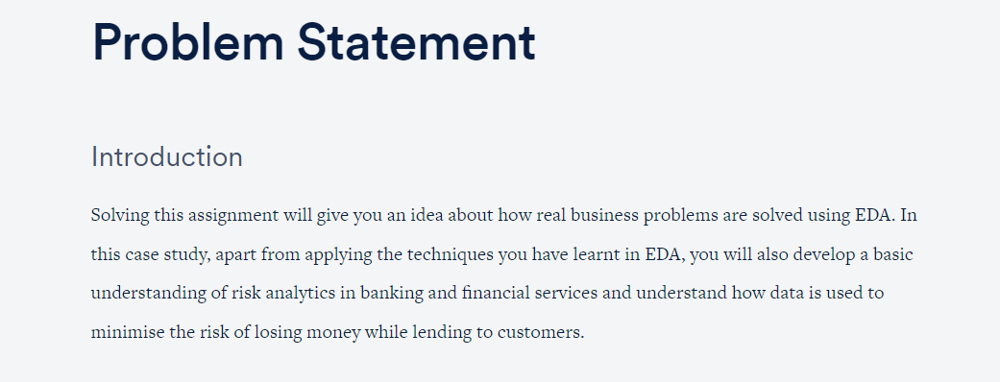
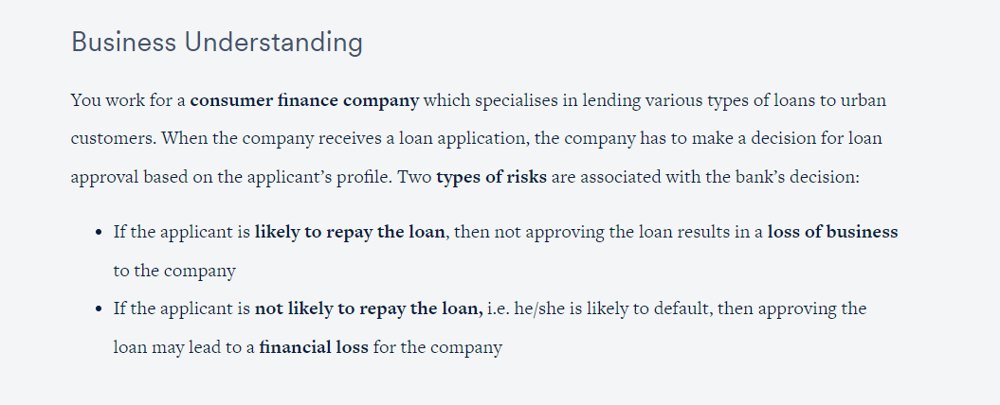
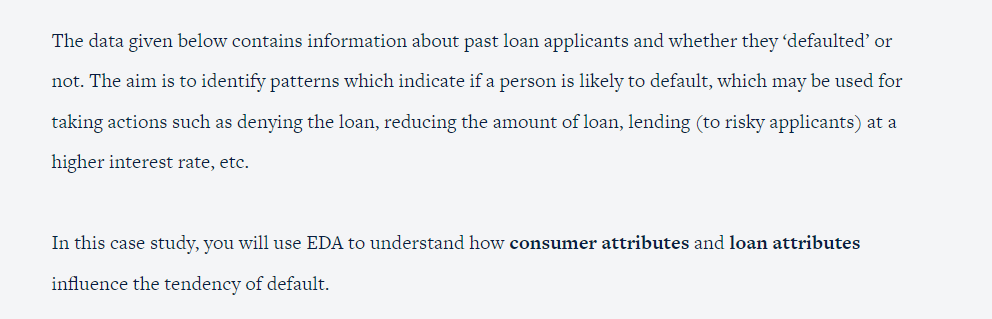
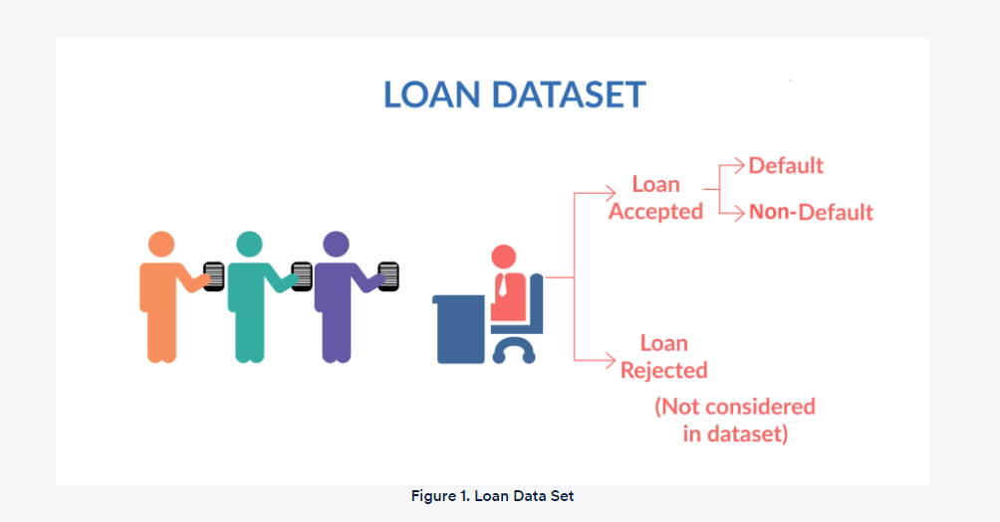
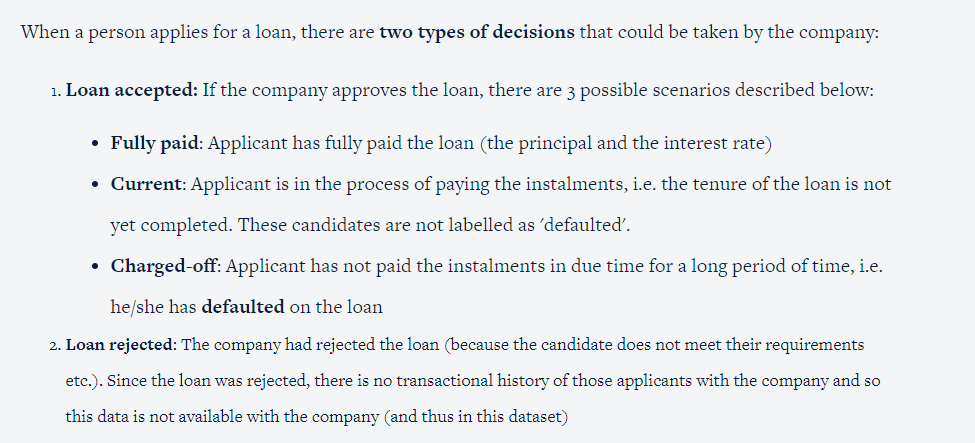

### Steps or Summary :
- Import Necessary Libraries
- Load the data and Data dictionary
- Data Understanding
- Missing Value Check
- Segmentation of Column
- Analysis:
    - Univariate Analysis (One Variable at a time)
    - Bivariate Analysis (Two Variable at a time)
    - Multivariate Analysis (More than two Variables at a time)

### Import Necessary Libraries


In [3]:
import numpy as np , pandas as pd
import matplotlib
import matplotlib.pyplot as plt , seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from matplotlib import style
sns.set(style='whitegrid')

### Check the version of libraries and upgrade before analysis if required 
##### Versions used during development
    numpy 1.26.4
    pandas 2.2.2
    seaborn 0.13.2
    matplotlib 3.9.0

In [4]:
print('numpy' , np.__version__)
print('pandas' ,pd.__version__)
print('seaborn' ,sns.__version__)
print('matplotlib', matplotlib.__version__)


python 3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]
numpy 1.26.4
pandas 2.2.2
seaborn 0.13.2
matplotlib 3.9.0


### Load the Data

In [3]:
loan=pd.read_csv('loan.csv')
# To display maximum rows and columns
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [4]:
data_dictionary = pd.read_excel('Data_Dictionary.xlsx')

In [5]:
loan.shape

(39717, 111)

In [6]:
loan.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Dtype  
---   ------                          -----  
 0    id                              int64  
 1    member_id                       int64  
 2    loan_amnt                       int64  
 3    funded_amnt                     int64  
 4    funded_amnt_inv                 float64
 5    term                            object 
 6    int_rate                        object 
 7    installment                     float64
 8    grade                           object 
 9    sub_grade                       object 
 10   emp_title                       object 
 11   emp_length                      object 
 12   home_ownership                  object 
 13   annual_inc                      float64
 14   verification_status             object 
 15   issue_d                         object 
 16   loan_status                     object 
 17   pymnt_plan

In [7]:
data_dictionary.head()

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...


In [8]:
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [9]:
loan.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,14035.000000,2786.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39661.0,0.0,39717.0,0.0,0.0,0.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39661.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,35.900962,69.698134,9.294408,0.055065,13382.528086,22.088828,51.227887,50.989768,12153.596544,11567.149118,9793.348813,2263.663172,1.363015,95.221624,12.406112,2678.826162,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,22.020060,43.822529,4.400282,0.237200,15885.016641,11.401709,375.172839,373.824457,9042.040766,8942.672613,7065.522127,2608.111964,7.289979,688.744771,148.671593,4447.136012,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,18.000000,22.000000,6.000000,0.000000,3703.000000,13.000000,0.000000,0.000000,5576.930000,5112.310000,4600.000000,662.180000,0.000000,0.000000,0.000000,218.680000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

#### Observation -  Looking at the description, there are a lot of missing or null values, so we have to perform Data Cleaning steps

### Missing Values Check

In [10]:
loan_original=loan.copy()

##### Let's create a copy of the original DataFrame before starting the cleaning operation. If we need to refer the original data at some point of analysis , then the "loan_original" can be checked. We'll use "loan" throughout for our analysis

In [11]:
loan_missingvalues=round( 100 * loan.isnull().mean() , 2 )
loan_missingvalues[loan_missingvalues>0].sort_values(ascending=False)

bc_open_to_buy                    100.00
acc_open_past_24mths              100.00
bc_util                           100.00
mo_sin_old_il_acct                100.00
mo_sin_old_rev_tl_op              100.00
mo_sin_rcnt_rev_tl_op             100.00
mo_sin_rcnt_tl                    100.00
mort_acc                          100.00
mths_since_recent_bc              100.00
mths_since_recent_bc_dlq          100.00
mths_since_recent_inq             100.00
mths_since_recent_revol_delinq    100.00
num_accts_ever_120_pd             100.00
num_actv_bc_tl                    100.00
num_actv_rev_tl                   100.00
num_bc_sats                       100.00
num_bc_tl                         100.00
num_il_tl                         100.00
num_op_rev_tl                     100.00
num_rev_accts                     100.00
num_rev_tl_bal_gt_0               100.00
num_sats                          100.00
num_tl_120dpd_2m                  100.00
num_tl_30dpd                      100.00
num_tl_90g_dpd_2

#### Let's remove the columns with 100% missing values first as they'll be of no use

In [12]:
loan = loan.drop(columns=loan_missingvalues[loan_missingvalues==100.00].index)

In [13]:
### check and validate the shape again
loan.shape

(39717, 57)

In [14]:
###check null or missing values again
loan_missingvalues=round( 100 * loan.isnull().mean() , 2 )
loan_missingvalues[loan_missingvalues>0].sort_values(ascending=False)

next_pymnt_d                  97.13
mths_since_last_record        92.99
mths_since_last_delinq        64.66
desc                          32.59
emp_title                      6.19
emp_length                     2.71
pub_rec_bankruptcies           1.75
last_pymnt_d                   0.18
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
revol_util                     0.13
tax_liens                      0.10
title                          0.03
last_credit_pull_d             0.01
dtype: float64

#### There are four columns where we have a lot of null or missing values ( more than 30%) . So we should also remove them in order to get exact picture

In [15]:
loan_missingvalues[loan_missingvalues>30.00]

desc                      32.59
mths_since_last_delinq    64.66
mths_since_last_record    92.99
next_pymnt_d              97.13
dtype: float64

In [16]:
loan = loan.drop(columns=loan_missingvalues[loan_missingvalues>30.00].index)

In [17]:
### check and validate the shape again
loan.shape

(39717, 53)

#### Let us have a look at the above columns to analyze further. Lets check the count of unique values present in each column.

In [18]:
loan.nunique().sort_values(ascending=True)

tax_liens                         1
delinq_amnt                       1
chargeoff_within_12_mths          1
acc_now_delinq                    1
application_type                  1
policy_code                       1
collections_12_mths_ex_med        1
initial_list_status               1
pymnt_plan                        1
term                              2
pub_rec_bankruptcies              3
verification_status               3
loan_status                       3
pub_rec                           5
home_ownership                    5
grade                             7
inq_last_6mths                    9
delinq_2yrs                      11
emp_length                       11
purpose                          14
sub_grade                        35
open_acc                         40
addr_state                       50
issue_d                          55
total_acc                        82
last_pymnt_d                    101
last_credit_pull_d              106
int_rate                    

In [19]:
loan[['pymnt_plan','initial_list_status','policy_code','collections_12_mths_ex_med','application_type','acc_now_delinq','chargeoff_within_12_mths','delinq_amnt','tax_liens']].head()

,pymnt_plan,initial_list_status,policy_code,collections_12_mths_ex_med,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,tax_liens
0,n,f,1,0.0,INDIVIDUAL,0,0.0,0,0.0
1,n,f,1,0.0,INDIVIDUAL,0,0.0,0,0.0
2,n,f,1,0.0,INDIVIDUAL,0,0.0,0,0.0
3,n,f,1,0.0,INDIVIDUAL,0,0.0,0,0.0
4,n,f,1,0.0,INDIVIDUAL,0,0.0,0,0.0


#### Since the above columns are having same data for all the rows , so these will not help us in analysis and hence we can remove these columns

In [20]:
loan = loan.drop( ['pymnt_plan','initial_list_status','policy_code','collections_12_mths_ex_med','application_type','acc_now_delinq','chargeoff_within_12_mths','delinq_amnt','tax_liens'] , axis=1 )

In [21]:
loan.nunique().sort_values(ascending=False)

id                         39717
url                        39717
member_id                  39717
total_pymnt                37850
total_pymnt_inv            37518
total_rec_int              35148
last_pymnt_amnt            34930
emp_title                  28820
revol_bal                  21711
title                      19615
installment                15383
funded_amnt_inv             8205
total_rec_prncp             7976
annual_inc                  5318
recoveries                  4040
dti                         2868
collection_recovery_fee     2616
total_rec_late_fee          1356
out_prncp_inv               1138
out_prncp                   1137
revol_util                  1089
funded_amnt                 1041
loan_amnt                    885
zip_code                     823
earliest_cr_line             526
int_rate                     371
last_credit_pull_d           106
last_pymnt_d                 101
total_acc                     82
issue_d                       55
addr_state

In [22]:
### check percentage of null or missing values again
loan_missingvalues=round( 100 * loan.isnull().mean() , 2 )
loan_missingvalues[loan_missingvalues>0].sort_values(ascending=False)

emp_title               6.19
emp_length              2.71
pub_rec_bankruptcies    1.75
last_pymnt_d            0.18
revol_util              0.13
title                   0.03
last_credit_pull_d      0.01
dtype: float64

In [23]:
### check count of null or missing values
loan_missingvalues=loan.isnull().sum() 
loan_missingvalues[loan_missingvalues>0].sort_values(ascending=False)


emp_title               2459
emp_length              1075
pub_rec_bankruptcies     697
last_pymnt_d              71
revol_util                50
title                     11
last_credit_pull_d         2
dtype: int64

In [24]:
missing_columns=loan_missingvalues[loan_missingvalues>0].sort_values(ascending=False)
data_dictionary[ data_dictionary['LoanStatNew'].isin(missing_columns.index) ]

,LoanStatNew,Description
19,emp_length,Employment length in years. Possible values ar...
20,emp_title,The job title supplied by the Borrower when ap...
36,last_credit_pull_d,The most recent month LC pulled credit for thi...
40,last_pymnt_d,Last month payment was received
86,pub_rec_bankruptcies,Number of public record bankruptcies
91,revol_util,"Revolving line utilization rate, or the amount..."
95,title,The loan title provided by the borrower


#### last_credit_pull_d, title, revol_util  and last_pymnt_d have minimal amount of missing values - 0.01% , 0.02% , 0.13% and 0.18% respectively. Upon checking the column description , we decided to remove nulls from here.
#### Also the columns emp_title and emp_length have 6.19% (2459 rows) and 2.71% ( 1075 rows ) missing values. These columns have information about the customer/borrower like their job title and their employment length in years. So we can remove this rows  as well where emp_title or  emp_length is missing .

In [25]:
loan=loan[ ( ~ loan.emp_length.isnull() ) & ( ~ loan.emp_title.isnull() ) &  ( ~ loan.title.isnull() ) & ( ~loan.revol_util.isnull() ) &  ( ~loan.last_pymnt_d.isnull() ) & ( ~loan.last_credit_pull_d.isnull() ) ]

In [26]:
#check value counts of null columns
loan_missingvalues=loan.isnull().sum()
missing_columns=loan_missingvalues[loan_missingvalues>0].sort_values(ascending=False)
for column in missing_columns.index:
    unique_percentage = ( loan[column].value_counts(normalize=True) * 100  ).head()
    print(f" Percentage of unique values in column '{column}':\n {unique_percentage} \n ")
    unique_count = ( loan[column].value_counts()  ).head()
    print(f" Count of unique values in column '{column}':\n {unique_count} \n ")

 Percentage of unique values in column 'pub_rec_bankruptcies':
 pub_rec_bankruptcies
0.0    95.877364
1.0     4.103423
2.0     0.019213
Name: proportion, dtype: float64 
 
 Count of unique values in column 'pub_rec_bankruptcies':
 pub_rec_bankruptcies
0.0    34931
1.0     1495
2.0        7
Name: count, dtype: int64 
 


#### Let's impute pub_rec_bankruptcies

In [27]:
loan['pub_rec_bankruptcies']=loan['pub_rec_bankruptcies'].fillna(loan['pub_rec_bankruptcies'].median())

In [28]:
### check count of null or missing values
loan.isnull().sum()

id                         0
member_id                  0
loan_amnt                  0
funded_amnt                0
funded_amnt_inv            0
term                       0
int_rate                   0
installment                0
grade                      0
sub_grade                  0
emp_title                  0
emp_length                 0
home_ownership             0
annual_inc                 0
verification_status        0
issue_d                    0
loan_status                0
url                        0
purpose                    0
title                      0
zip_code                   0
addr_state                 0
dti                        0
delinq_2yrs                0
earliest_cr_line           0
inq_last_6mths             0
open_acc                   0
pub_rec                    0
revol_bal                  0
revol_util                 0
total_acc                  0
out_prncp                  0
out_prncp_inv              0
total_pymnt                0
total_pymnt_in

### Segmentation of Columns

In [29]:
loan.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'url', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies'],
      dtype='object')

In [30]:
loan.shape

(37087, 44)

#### Identification of relevant columns and variables
- There are some columns such as "id", "member_id", "url", "title", "emp_title", "zip_code", "last_credit_pull_d", "addr_state". This columns doesn't contribute to the loan defaulting in any way due to irrelevant information. Hence can be ignored or removed.
- "out_prncp_inv" , "total_pymnt_inv " are useful for investors but not contributing to the loan defaulting analysis. Hence also can be ignored or removed.
- "funded_amnt" may not be needed because we only need info as to how much is funded in actual ,and also  we have "funded_amnt_inv" , but still we want to remove "funded_amnt".
- There are also some columns which will probably be used after approving the loan. Since we are analyzing the user details and the driving factors of loan defaulting before approving loan , we can safely ignore or remove the columns / variables corresponding to that scenario. Below is the list of these columns 
##### List of post-approval features columns / variables 
- revol_bal
- out_prncp
- total_pymnt
- total_rec_prncp
- total_rec_int
- total_rec_late_fee
- recoveries
- collection_recovery_fee
- last_pymnt_d
- last_pymnt_amnt
- next_pymnt_d
- chargeoff_within_12_mths
- mths_since_last_delinq
- mths_since_last_record

In [31]:
loan.nunique()

id                         37087
member_id                  37087
loan_amnt                    873
funded_amnt                 1030
funded_amnt_inv             7800
term                           2
int_rate                     368
installment                14749
grade                          7
sub_grade                     35
emp_title                  28683
emp_length                    11
home_ownership                 5
annual_inc                  4986
verification_status            3
issue_d                       55
loan_status                    3
url                        37087
purpose                       14
title                      18340
zip_code                     818
addr_state                    50
dti                         2857
delinq_2yrs                   11
earliest_cr_line             510
inq_last_6mths                 9
open_acc                      40
pub_rec                        5
revol_bal                  21010
revol_util                  1082
total_acc 

In [32]:
# Categorical Column
cat_cols=['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status','purpose','inq_last_6mths','pub_rec', 'pub_rec_bankruptcies' , 'addr_state' , 'delinq_2yrs']
# Numerical Columns
num_cols=['loan_amnt', 'funded_amnt' , 'funded_amnt_inv','int_rate', 'installment', 'annual_inc', 'dti', 'open_acc', 'revol_util', 'total_acc', 'total_pymnt' , 'total_pymnt_inv']
# Date Columns
date_cols=['issue_d','earliest_cr_line','last_credit_pull_d']
# Not relevant to the analysis
extra_cols=[ "id", "member_id", "url", "title", "emp_title", "zip_code", "last_credit_pull_d", "revol_bal","out_prncp","total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_d","last_pymnt_amnt","out_prncp_inv"]

In [33]:
loan=loan.drop(columns=extra_cols)

In [34]:
loan.shape

(37087, 27)

#### Looking into the object variables to check if they are required to be converted to numeric

In [35]:
newdf = loan.select_dtypes(include=object)
newdf.head()

,term,int_rate,grade,sub_grade,emp_length,home_ownership,verification_status,issue_d,loan_status,purpose,addr_state,earliest_cr_line,revol_util
1,60 months,15.27%,C,C4,< 1 year,RENT,Source Verified,Dec-11,Charged Off,car,GA,Apr-99,9.40%
3,36 months,13.49%,C,C1,10+ years,RENT,Source Verified,Dec-11,Fully Paid,other,CA,Feb-96,21%
4,60 months,12.69%,B,B5,1 year,RENT,Source Verified,Dec-11,Current,other,OR,Jan-96,53.90%
5,36 months,7.90%,A,A4,3 years,RENT,Source Verified,Dec-11,Fully Paid,wedding,AZ,Nov-04,28.30%
6,60 months,15.96%,C,C5,8 years,RENT,Not Verified,Dec-11,Fully Paid,debt_consolidation,NC,Jul-05,85.60%


#### Convert int_rate, revol_util and term into numerical by making necessary impuatations

In [36]:
loan['int_rate'] = loan['int_rate'].str.strip('%').astype('float64')
loan['revol_util'] = loan['revol_util'].str.strip('%').astype('float64')
loan['term'] = loan['term'].str.strip(' months').astype('int64')

In [37]:
#### Convert emp_length into numeric
emp_length_dict = {
    '< 1 year' : 0,
    '1 year' : 1,
    '2 years' : 2,
    '3 years' : 3,
    '4 years' : 4,
    '5 years' : 5,
    '6 years' : 6,
    '7 years' : 7,
    '8 years' : 8,
    '9 years' : 9,
    '10+ years' : 10
}
loan['emp_length_dict'] = loan['emp_length'].apply( lambda x: emp_length_dict.get(x) )

#### Converting these datatypes to datetime -  issue_d , earliest_cr_line

In [38]:
loan.issue_d = pd.to_datetime(loan.issue_d, format='%b-%y')
loan.earliest_cr_line = pd.to_datetime(loan.earliest_cr_line, format='%b-%y')

In [39]:
newdf = loan.select_dtypes(include=object)
newdf.head()

,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,addr_state
1,C,C4,< 1 year,RENT,Source Verified,Charged Off,car,GA
3,C,C1,10+ years,RENT,Source Verified,Fully Paid,other,CA
4,B,B5,1 year,RENT,Source Verified,Current,other,OR
5,A,A4,3 years,RENT,Source Verified,Fully Paid,wedding,AZ
6,C,C5,8 years,RENT,Not Verified,Fully Paid,debt_consolidation,NC


#### Let's split the date columns to month and year to get a proper year wise analysis or month wise analysis later if required

In [40]:
loan['issue_d_month'] = loan['issue_d'].dt.month
loan['issue_d_year'] = loan['issue_d'].dt.year

loan['earliest_cr_line_month'] = loan['earliest_cr_line'].dt.month
loan['earliest_cr_line_year'] = loan['earliest_cr_line'].dt.year

In [41]:
loan.issue_d_year.value_counts()

issue_d_year
2011    20156
2010    10795
2009     4424
2008     1485
2007      227
Name: count, dtype: int64

In [42]:
loan.earliest_cr_line.value_counts()

earliest_cr_line
1998-11-01    358
1999-10-01    351
1998-12-01    333
2000-10-01    324
2000-11-01    308
1997-12-01    301
1999-11-01    300
2000-09-01    288
1997-11-01    285
1998-10-01    285
1995-12-01    278
1999-12-01    277
2000-12-01    271
2000-01-01    269
2000-07-01    264
1996-11-01    258
1996-12-01    258
2001-09-01    256
2002-10-01    255
2000-08-01    255
2001-10-01    254
2000-05-01    245
2000-04-01    243
1999-09-01    242
1998-08-01    239
1999-01-01    235
2003-10-01    235
1999-08-01    234
2001-01-01    233
1997-10-01    231
1994-12-01    229
2002-09-01    227
1998-09-01    224
1996-01-01    224
2004-10-01    222
1997-01-01    221
2000-02-01    214
1996-10-01    213
2003-11-01    212
1995-11-01    211
2000-06-01    209
1994-01-01    208
2001-12-01    208
1999-02-01    207
1999-07-01    205
2000-03-01    202
2003-09-01    201
1997-08-01    200
1999-05-01    198
1993-12-01    197
2001-08-01    195
2004-09-01    195
1994-11-01    193
1999-03-01    193
2001-05-01 

#### We can see that for earliest_cr_line_year, there are years which are even greater than 2011 which is absurd since this column represents the earliest credit line for the customer.  Clearly, there is a year conversion issue resulting in 1964 to become 2064 and so on. Let's convert them back.

In [43]:
loan.loc[loan['earliest_cr_line_year'] > 2011 , 'earliest_cr_line_year'] = loan['earliest_cr_line_year'] - 100

### Data Cleaning Done, Will start analyzing the data now.
### Since we need to compare between the people who fully paid and the ones who defaulted, we will filter the data accordingly

In [44]:
loan = loan[loan['loan_status'].isin(['Fully Paid','Charged Off'])]
loan.shape

(36021, 32)

In [45]:
loan_cleaned=loan.copy()

## Univariate Analysis

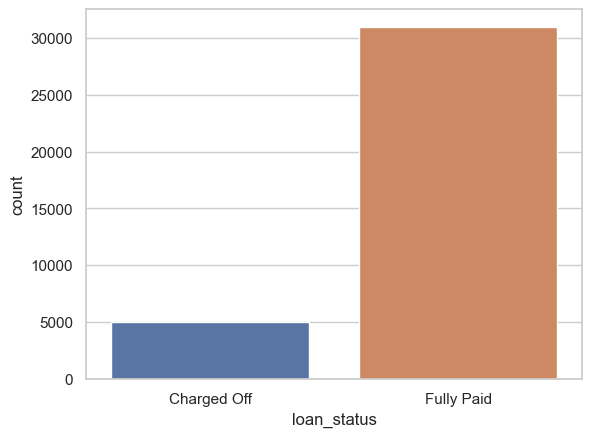

In [46]:
sns.countplot(x=loan["loan_status"],palette='deep')
plt.show()

In [47]:
round( 100* loan["loan_status"].value_counts(normalize=True) )

loan_status
Fully Paid     86.0
Charged Off    14.0
Name: proportion, dtype: float64

#### Observations - 
<b> We can infer that - </b>
1. Most of the loans are Fully paid
2. Around 14% loans are Charged Off

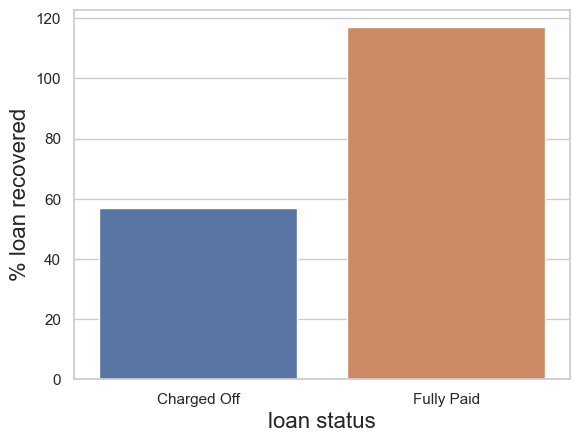

In [48]:
loan_status_pivot=pd.pivot_table(data=loan[["loan_status","loan_amnt","total_pymnt"]] , values=["loan_amnt","total_pymnt"] , index="loan_status" ,aggfunc=np.sum )
loan_status_pivot["% loan recovered"]=round( 100 * loan_status_pivot['total_pymnt'] / loan_status_pivot['loan_amnt'] )
sns.barplot(loan_status_pivot["% loan recovered"] , palette='deep')
plt.xlabel('loan status', fontsize=16)
plt.ylabel('% loan recovered', fontsize=16)
plt.show()

#### Observations -
<b> Variable - loan_amnt </b> - We can see that when a loan is Charged_Off, the bank can recover close to 57% of the amount

### Numerical Columns

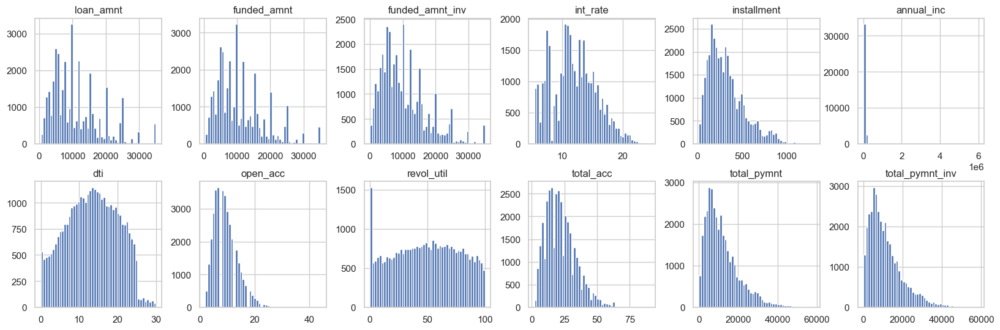

In [49]:
# plotting numerical data in a single plot
loan[num_cols].hist(bins=50,figsize=(20,20), color='#4C72B0', layout=(6,6));

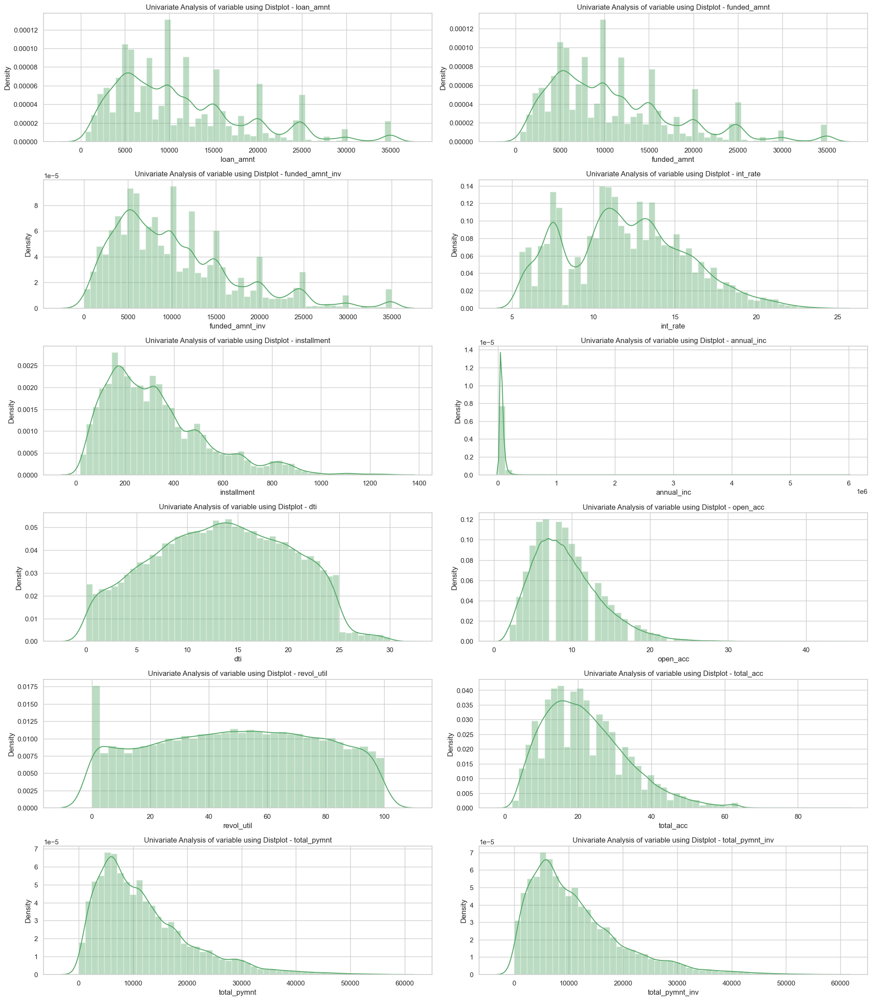

In [50]:
plt.figure(figsize=(20,30))
for ax , col in enumerate(num_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.distplot( loan[col] , color='#55A868' )
    plt.title( f' Univariate Analysis of variable using Distplot - {col} ' )
plt.tight_layout()
plt.show()

#### Observations - 
1. <b> Variable - loan_amnt </b> - Loan amounts are left skewed and generally in the range of 5000 - 10000 with spikes at every 5000 interval
2. <b> Variable - annual_inc </b> - Very Few people have very high annual income

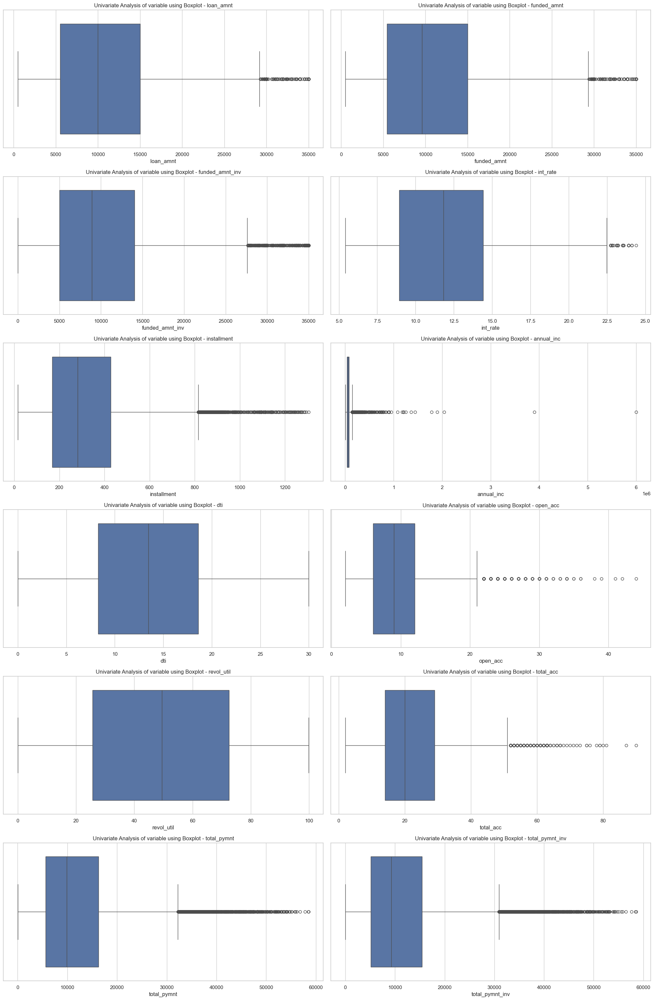

In [51]:
plt.figure(figsize=(20,40))
for ax , col in enumerate(num_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.boxplot( x=loan[col] , color='#4C72B0' )
    plt.title( f' Univariate Analysis of variable using Boxplot - {col} ' )
plt.tight_layout()
plt.show()

In [52]:
loan=loan_cleaned.copy()

### Outlier Teatment

#### Observations - 
1. <b> Variable - annual_inc </b> : Looks like the feature "annual_inc" has outliers in the upper fence. There is a huge jump of data in "annual_inc" and that can be trimmed.
2. <b> Variable - annual_inc </b> : The average interest rate is 12% but there is huge jump after 75 percentile.
3. <b> Variable - loan_amnt </b> : Most of the borrowers prefer to get loan amount between 5k to 15k.
4. <b> Variable - init_rate </b> : Almost of the borrowers gets interest rate between 9% to 14%.

In [53]:
for i in num_cols:
    print(f'Quartile info for variable {i} - ' , np.quantile( loan[i] , [0.5, 0.75,0.90, 0.95, 0.97,0.98, 0.99,1] ) )

Quartile info for variable loan_amnt -  [10000. 15000. 21600. 25000. 28000. 30000. 35000. 35000.]
Quartile info for variable funded_amnt -  [ 9600. 15000. 20000. 25000. 26660. 30000. 35000. 35000.]
Quartile info for variable funded_amnt_inv -  [ 8900.       14046.4222   19975.       24506.6328   25650.
 29765.153288 34555.48557  35000.      ]
Quartile info for variable int_rate -  [11.83 14.42 16.82 18.39 19.29 20.03 20.99 24.4 ]
Quartile info for variable installment -  [ 280.91  426.99  619.81  754.73  828.69  869.85  925.54 1305.19]
Quartile info for variable annual_inc -  [  60000.   82320.  115000.  140000.  162000.  184000.  230000. 6000000.]
Quartile info for variable dti -  [13.47  18.61  22.34  23.82  24.51  24.84  26.486 29.99 ]
Quartile info for variable open_acc -  [ 9. 12. 15. 18. 19. 20. 22. 44.]
Quartile info for variable revol_util -  [49.5  72.5  87.8  93.5  95.84 97.2  98.4  99.9 ]
Quartile info for variable total_acc -  [20. 29. 38. 43. 48. 51. 56. 90.]
Quartile info

##### Outlier Treatment for Variable - annual_inc

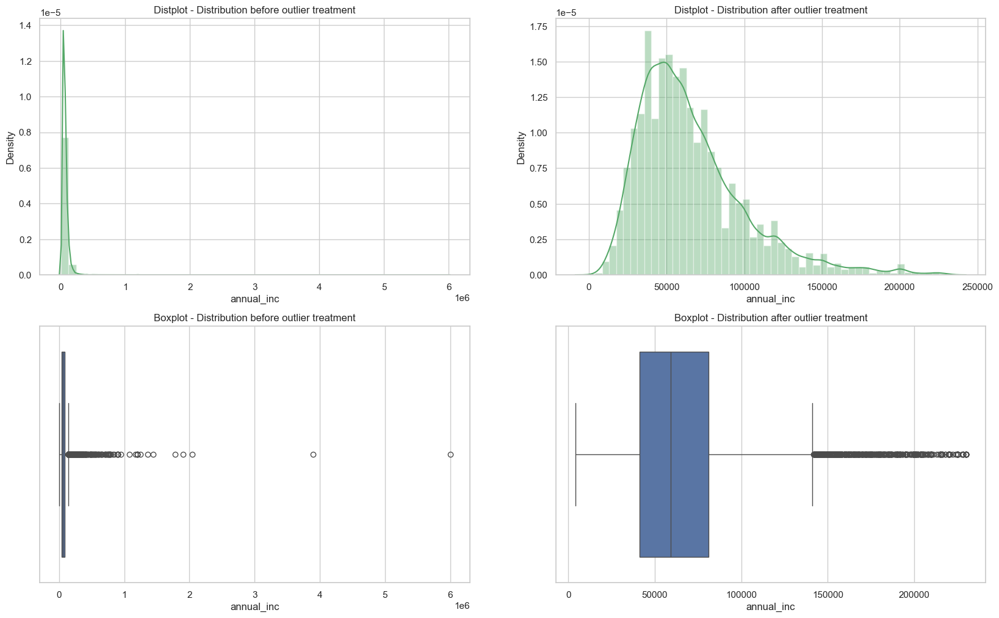

In [54]:
# Removing the data above 99% in upper fence of annual income

# Distribution plot before outlier removal
plt.figure(figsize=(20,12))
plt.subplot(2,2,1)
ax = sns.distplot(loan['annual_inc'], color='#55A868')
ax.set_title('Distplot - Distribution before outlier treatment')
plt.subplot(2,2,3)
ax = sns.boxplot(x=loan['annual_inc'], color='#4C72B0')
ax.set_title('Boxplot - Distribution before outlier treatment')

# Removing outliers
loan = loan[loan['annual_inc'] <= loan['annual_inc'].quantile(0.99)]

# Distribution plot after outlier removal
plt.subplot(2,2,2)
ax = sns.distplot(loan['annual_inc'], color='#55A868')
ax.set_title('Distplot - Distribution after outlier treatment')
plt.subplot(2,2,4)
ax = sns.boxplot(x=loan['annual_inc'], color='#4C72B0')
ax.set_title('Boxplot - Distribution after outlier treatment')
plt.show()

##### Outlier treatment for open_acc 

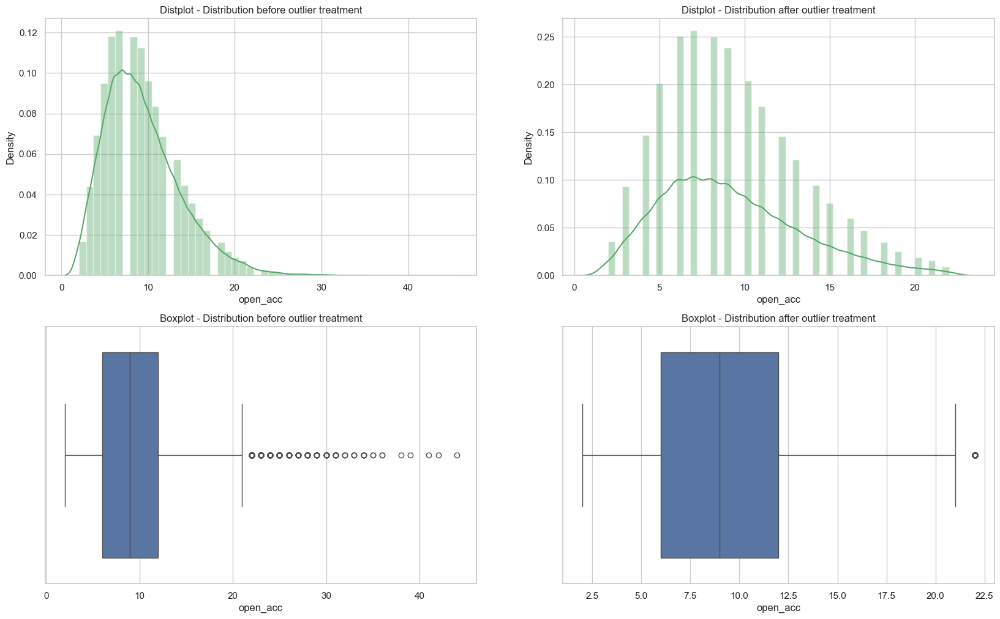

In [55]:
# Removing the data in upper fence of annual income

# Distribution plot before outlier removal
plt.figure(figsize=(20,12))
plt.subplot(2,2,1)
ax = sns.distplot(loan['open_acc'], color='#55A868')
ax.set_title('Distplot - Distribution before outlier treatment')
plt.subplot(2,2,3)
ax = sns.boxplot(x=loan['open_acc'], color='#4C72B0')
ax.set_title('Boxplot - Distribution before outlier treatment')

# Removing outliers
loan = loan[ loan['open_acc'] <= loan['open_acc'].quantile(0.99) ]

# Distribution plot after outlier removal
plt.subplot(2,2,2)
ax = sns.distplot(loan['open_acc'], color='#55A868')
ax.set_title('Distplot - Distribution after outlier treatment')
plt.subplot(2,2,4)
ax = sns.boxplot(x=loan['open_acc'], color='#4C72B0')
ax.set_title('Boxplot - Distribution after outlier treatment')
plt.show()

In [56]:
def remove_upperoutliers(df, column):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    # Calculate the Interquartile Range (IQR)
    IQR = Q3 - Q1
    # Define the upper and lower bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Filter the DataFrame to remove outliers
    df_filtered = df[ (df[column] >= lower_bound) & (df[column] <= upper_bound) ]
    return df_filtered

##### Outlier treatment for total_acc 

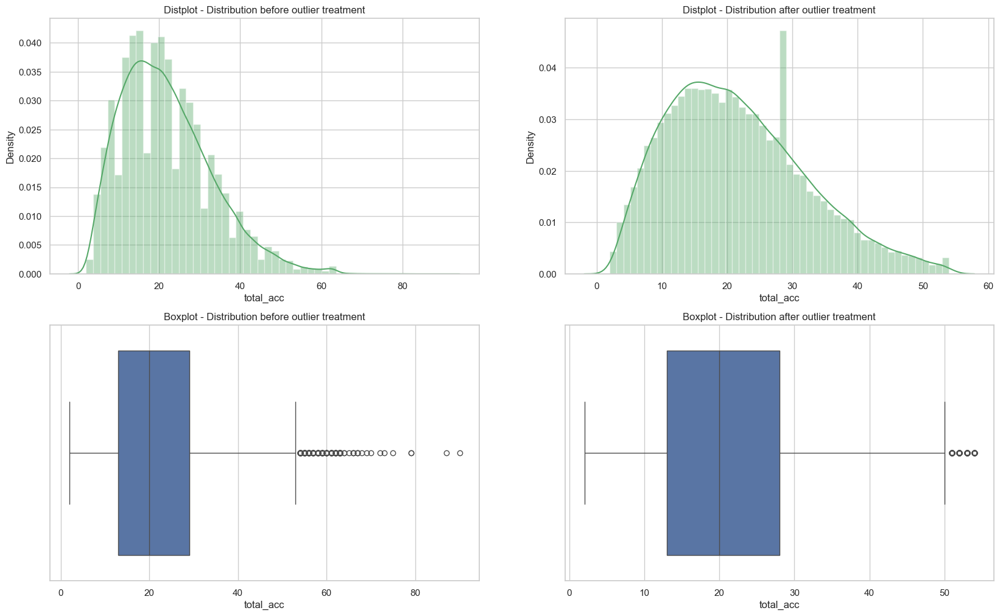

In [57]:
# Removing the data in upper fence of annual income

# Distribution plot before outlier removal
plt.figure(figsize=(20,12))
plt.subplot(2,2,1)
ax = sns.distplot(loan['total_acc'], color='#55A868')
ax.set_title('Distplot - Distribution before outlier treatment')
plt.subplot(2,2,3)
ax = sns.boxplot(x=loan['total_acc'], color='#4C72B0')
ax.set_title('Boxplot - Distribution before outlier treatment')

# Removing outliers
loan = loan[ loan['total_acc'] <= loan['total_acc'].quantile(0.99) ]

# Distribution plot after outlier removal
plt.subplot(2,2,2)
ax = sns.distplot(loan['total_acc'], color='#55A868')
ax.set_title('Distplot - Distribution after outlier treatment')
plt.subplot(2,2,4)
ax = sns.boxplot(x=loan['total_acc'], color='#4C72B0')
ax.set_title('Boxplot - Distribution after outlier treatment')
plt.show()

In [58]:
for i in num_cols:
    print(f'Quartile info for variable {i} - ' , np.quantile( loan[i] , [0.5, 0.75,0.90, 0.95, 0.97,0.98, 0.99,1] ) )

Quartile info for variable loan_amnt -  [ 9800. 15000. 21000. 25000. 28000. 30000. 35000. 35000.]
Quartile info for variable funded_amnt -  [ 9600. 15000. 20000. 25000. 25975. 30000. 35000. 35000.]
Quartile info for variable funded_amnt_inv -  [ 8775.        14000.        19975.        24342.877358  25000.
 29524.        33923.4256142 35000.       ]
Quartile info for variable int_rate -  [11.71 14.27 16.77 18.25 19.29 19.91 20.89 24.4 ]
Quartile info for variable installment -  [ 278.47   421.74   610.136  737.925  819.89   862.36   916.819 1305.19 ]
Quartile info for variable annual_inc -  [ 58000.    80000.   110000.   132000.   150000.   161480.   184997.92
 230000.  ]
Quartile info for variable dti -  [13.46   18.59   22.34   23.82   24.51   24.8448 26.47   29.99  ]
Quartile info for variable open_acc -  [ 9. 12. 15. 17. 18. 19. 20. 22.]
Quartile info for variable revol_util -  [49.7 72.6 87.9 93.6 95.9 97.2 98.5 99.9]
Quartile info for variable total_acc -  [20. 28. 36. 41. 44. 47

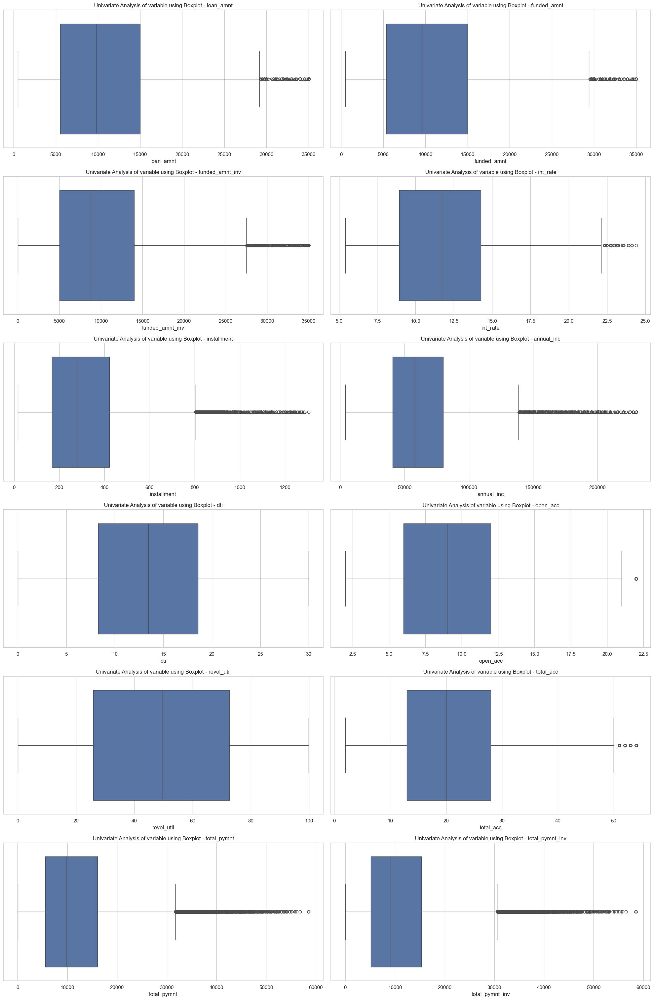

In [59]:
plt.figure(figsize=(20,40))
for ax , col in enumerate(num_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.boxplot( x=loan[col] , color='#4C72B0' )
    plt.title( f' Univariate Analysis of variable using Boxplot - {col} ' )
plt.tight_layout()
plt.show()

#### Decision -
For some variables , though there are some values far from distributions, the distributions look pretty continous and so we have decided not to perform any further outlier treatments to remove the extreme values for these above columns.

### Categorical Columns

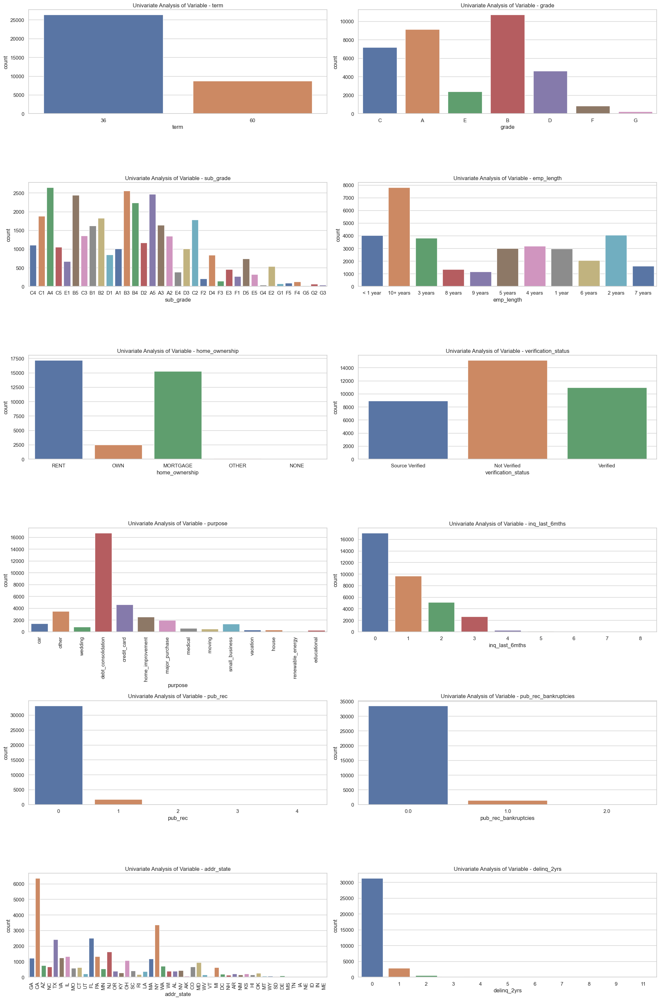

In [60]:
plt.figure(figsize=(20,40))
for ax , col in enumerate(cat_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.countplot( x=loan[col] , palette='deep' )
    plt.title( f'Univariate Analysis of Variable - {col}' )
    if col in ('purpose','addr_state') :
        plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Observations - 
1. <b> Variable - grade </b> - We can see that most of the loans are high graded loans and thus not too prone to suffer default.
2. <b> Variable - emp_length </b> - From the above plot it can be seen that most employees for whom loans have been lent out are of 10+ years of experience
3. <b> Variable - purpose </b> - The majority of the loans issued are for debt_consolidation
4. <b> Variable - term </b> - More loans issued are for 36 months compared to other terms.

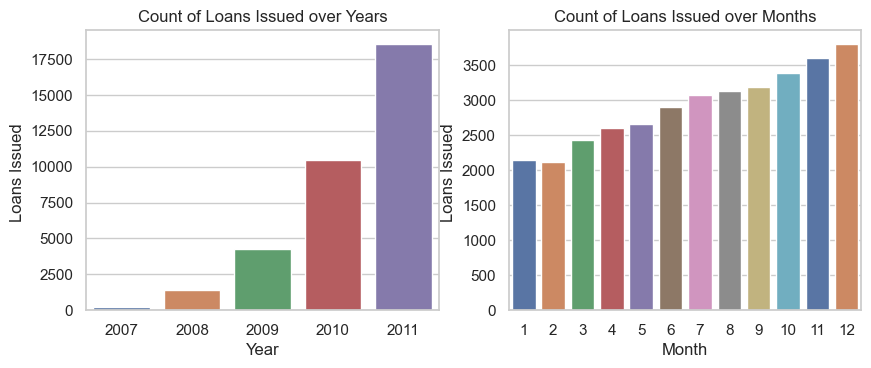

In [61]:
## Plot of issue year with loan status
plt.figure(figsize=[10,8])
plt.subplot(2,2,1)
ax1=sns.countplot(data=loan ,x='issue_d_year' , palette='deep' )
ax1.set_title('Count of Loans Issued over Years')
plt.xlabel('Year')
plt.ylabel('Loans Issued ')
# over month
plt.subplot(2,2,2)
ax1=sns.countplot(data=loan ,x='issue_d_month' , palette='deep' )
ax1.set_title('Count of Loans Issued over Months')
plt.xlabel('Month')
plt.ylabel('Loans Issued ')
plt.show()

#### Observations-
1. <b> Variables - issue_d_year </b> :There is a clear increasing trend in the number of loans issued over the years, with a significant rise from 2009 to 2011.
2. <b> Variables -  issue_d_month </b> :There is a clear increasing trend in the number of loans issued over the months, with a significant rise from Jan to Dec.

## Bivariate Analysis

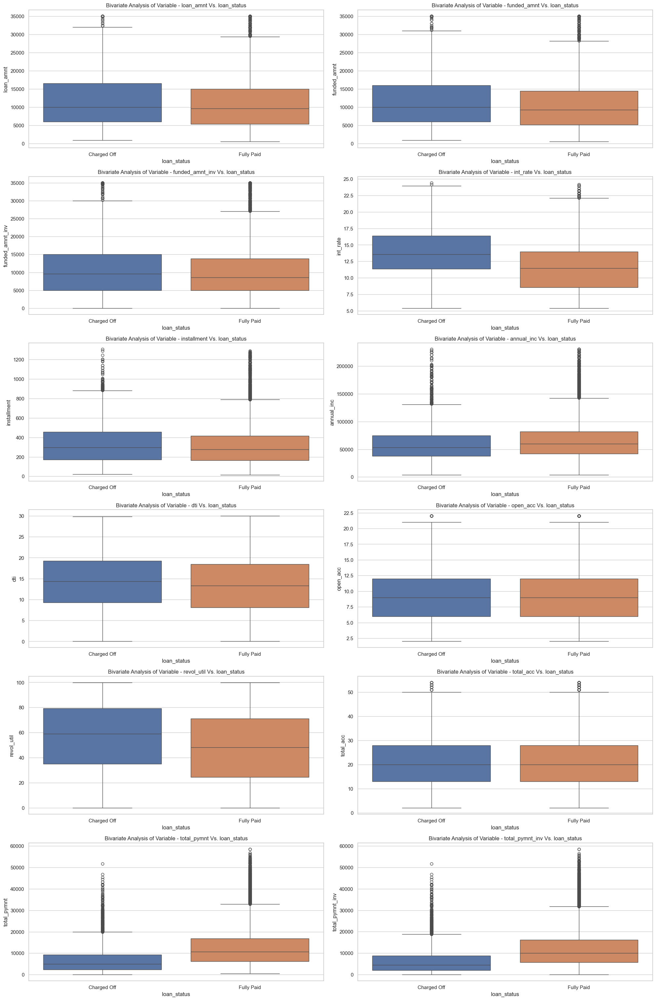

In [62]:
# Numerical Vs Categorical
plt.figure(figsize=(20,40))
for ax , col in enumerate(num_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.boxplot(x=loan["loan_status"] , y=loan[col] , palette='deep')
    plt.title( f' Bivariate Analysis of Variable - {col} Vs. loan_status ' )
plt.tight_layout()
plt.show()

#### Observations - 
1. <b> Variable - loan_amnt </b> - Almost identical 25% and mean for both loan_status (Charged Off and Fully Paid)
2. <b> Variable - init_rate<b> - Loans with higher interest rates are more likely to default or be charged off. There is a indication of negative correlation between init_rate and loan_status. We'll check this at later point of time.
3. <b> Variable - installment </b> - Almost identical 25% and mean for both loan_status (Charged Off and Fully Paid)
4. <b> Variable - dti </b> - Members with slight high dti are more likely to default or be charged off,  although the differences are minimal.

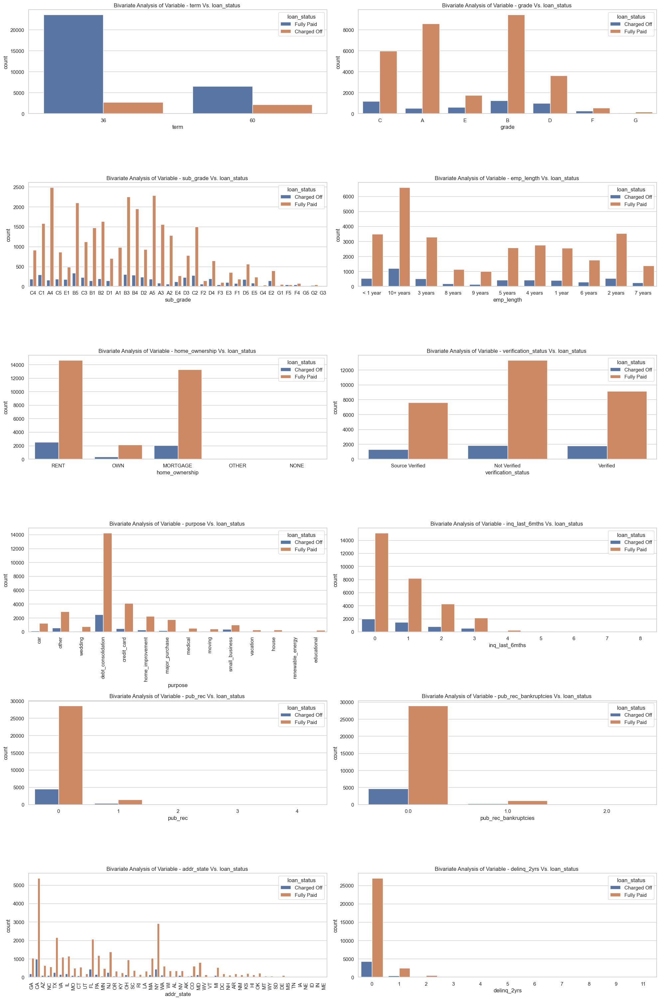

In [63]:
# Categorical Vs Categorical
plt.figure(figsize=(20,40))
for ax , col in enumerate(cat_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.countplot(data=loan[cat_cols] , hue=loan["loan_status"] , x=loan[col] , palette='deep' )
    plt.title( f'Bivariate Analysis of Variable - {col} Vs. loan_status ' )
    if col in ('purpose','addr_state') :
        plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Observations - 
1. <b> Variable - emp_length </b> - From the above plot, although it can be seen that people with 10+ experience pay off their loans much more, but they default on the loans as well to quite an extent. The loan defaults steadily increase from 1-3 years and then falls and has a big spike on 10+.
2. <b> Variable - term </b> - most loans issued for 36 months are fully paid.
3. <b> Variable - grade </b> - We can see that most of the loans from all the grades are coming under default list. So, no strong relation is found between loan_status and grades of members.
4. <b>Variable - add_state </b>: California (CA) has the highest number of loan applications, with more fully paid loans and more charged off loans compared to other states.This version succinctly highlights the key points about the add_state variable and its relationship to loan status in California.
5. <b>Variable - pub_rec_bankruptcies</b>: The average number of public record bankruptcies varies across different loan statuses. Loans that are charged off have a higher average number of bankruptcies (0.067), compared to loans that are fully paid (0.039) and those that are currently active (0.036).
6. <b> Variable - purpose </b> : The majority of the loans issued are for debt consolidation, and default loans are also primarily for this purpose.
7. <b> Variable - home_ownership </b> :  Applicants who own their homes outright are less prone to default compared to renters and mortgage holders, as indicated by the lower count of default loans  in the "OWN" category compared to renters and mortgage holders.
8. <b> Variable - inq_last_6mths </b> : There appears to be an inverse relationship between the number of inquiries in the last 6 months and the likelihood of a loan being charged off. 

### Relation with State and Population

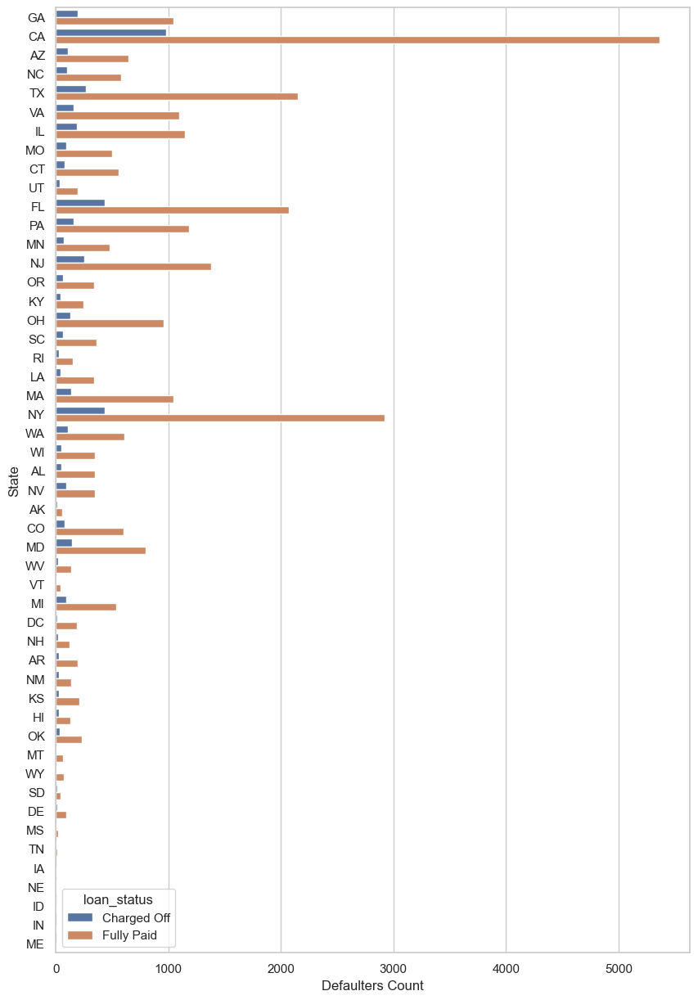

In [64]:
##Defaulters Count from State
###state = loan[loan['loan_status']=='Charged Off'].groupby('addr_state')['loan_status'].count().reset_index()
plt.figure(figsize=(10,15))
sns.countplot(y='addr_state', hue='loan_status', data=loan , palette='deep')
plt.xlabel('Defaulters Count')
plt.ylabel('State')
plt.show()

<b> Variable - add_state </b> : CA (California) has the highest count of loan statuses, with 1,125 entries. NY (New York) follows with 495 entries. FL (Florida) has 504 entries.Several states have relatively low counts, such as ID (Idaho) with only 1 entry and NE (Nebraska) with 3 entries.States with higher populations and economic activity, such as California, New York, and Florida, tend to have higher counts of loan statuses.

### Changes in variables over years and months 

#### Loans issued per month and year

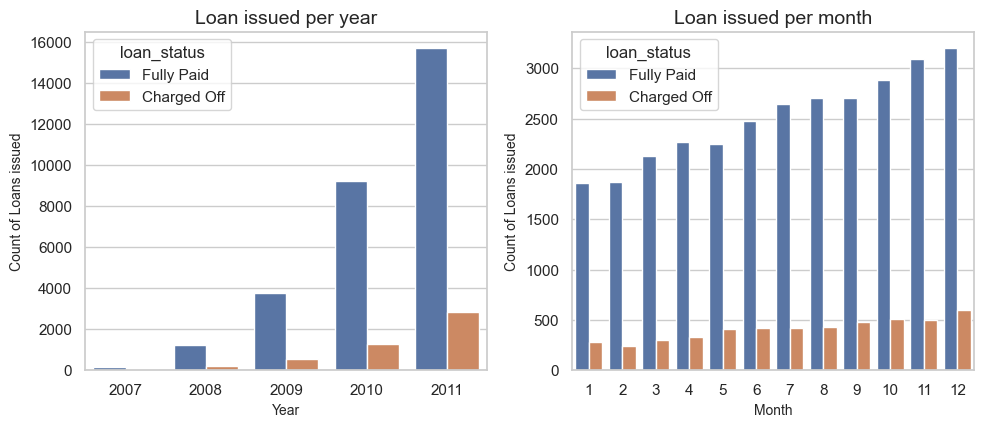

In [65]:
# Count plot for issue year
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
ax1 = sns.countplot(data = loan , x=loan['issue_d_year'] , hue=loan["loan_status"], palette='deep')
ax1.set_title('Loan issued per year',fontsize=14)
ax1.set_ylabel('Count of Loans issued',fontsize =10)
ax1.set_xlabel('Year',fontsize =10) 

# Count plot for issue month
plt.subplot(2,2,2)
ax2 = sns.countplot(data = loan , x=loan['issue_d_month'] , hue=loan["loan_status"], palette='deep')
ax2.set_title('Loan issued per month',fontsize=14)
ax2.set_ylabel('Count of Loans issued',fontsize =10)
ax2.set_xlabel('Month',fontsize =10)  
plt.tight_layout()
plt.show()

#### Terms opted by the borrower over the years and months

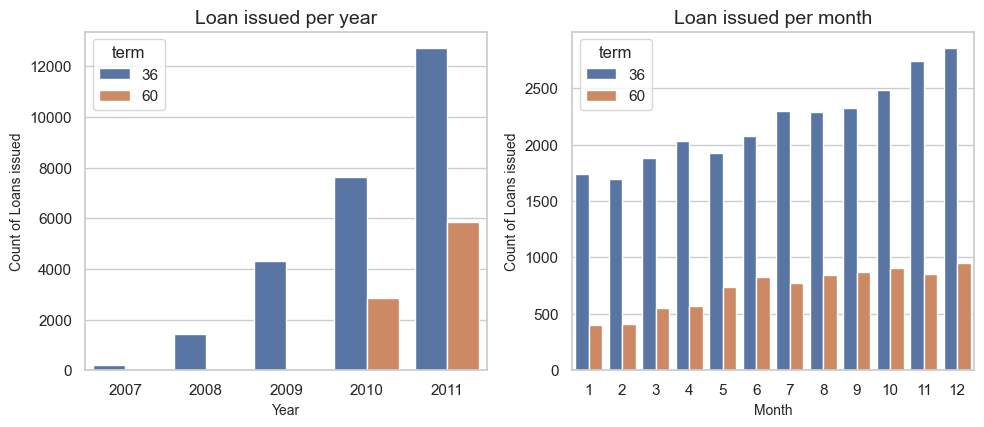

In [66]:
# Count plot for issue year
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
ax1 = sns.countplot(data = loan , x=loan['issue_d_year'] , hue=loan["term"], palette='deep')
ax1.set_title('Loan issued per year',fontsize=14)
ax1.set_ylabel('Count of Loans issued',fontsize =10)
ax1.set_xlabel('Year',fontsize =10) 

# Count plot for issue month
plt.subplot(2,2,2)
ax2 = sns.countplot(data = loan , x=loan['issue_d_month'] , hue=loan["term"], palette='deep')
ax2.set_title('Loan issued per month',fontsize=14)
ax2.set_ylabel('Count of Loans issued',fontsize =10)
ax2.set_xlabel('Month',fontsize =10)  
plt.tight_layout()
plt.show()

##### Observations -
<b> Variables - issue_d_year , issue_d_month and loan_status </b> :There is a clear increasing trend in the number of loans issued over the years, with a significant rise from 2009 to 2011. For each year number of borrowers keeps on increasing and they opt for 36 months tenure. Loans approved on Q4 are more likely to default.

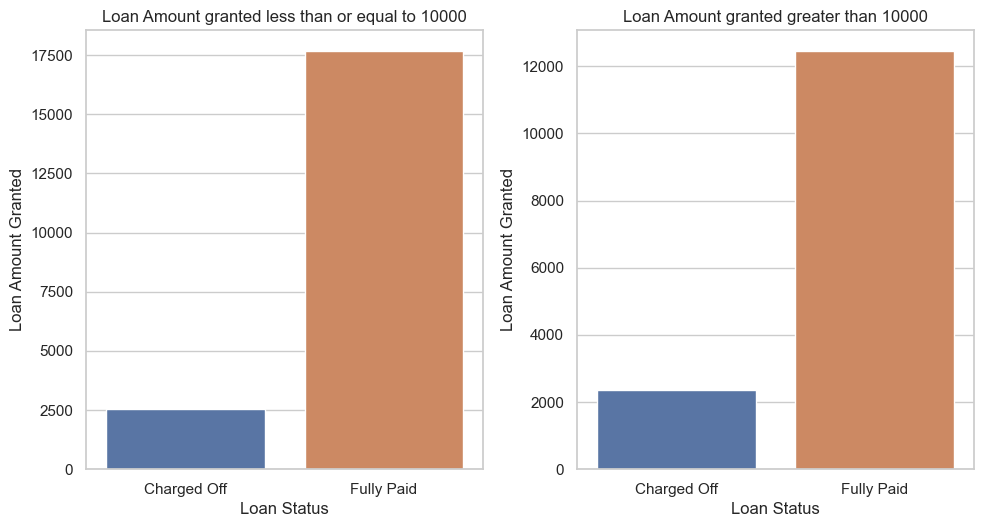

In [67]:
loan_less = loan[loan['loan_amnt'] <= 10000].groupby(['loan_status'])['loan_amnt'].count().reset_index()
loan_greater = loan[loan['loan_amnt'] > 10000].groupby(['loan_status'])['loan_amnt'].count().reset_index()
plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
ax1=sns.barplot(x='loan_status', y='loan_amnt', data=loan_less , palette='deep')
ax1.set_title('Loan Amount granted less than or equal to 10000')
plt.xlabel('Loan Status')
plt.ylabel('Loan Amount Granted')

plt.subplot(2,2,2)
ax2=sns.barplot(x='loan_status', y='loan_amnt', data=loan_greater , palette='deep')
ax2.set_title('Loan Amount granted greater than 10000')
plt.xlabel('Loan Status')
plt.ylabel('Loan Amount Granted')

plt.tight_layout()
plt.show()

##### Observations -
<b> Variable- loan_amnt </b> : Among loans with amounts less than or equal to 10,000, there are more loans that are fully paid compared to charged off. Among loans with amounts greater than or equal to 10,000, there are also more loans that are fully paid compared to charged off. The proportion of charged off loans appears to be lower in both loan amount categories compared to fully paid loans.

#### Analysis of other variables apart from loan_status

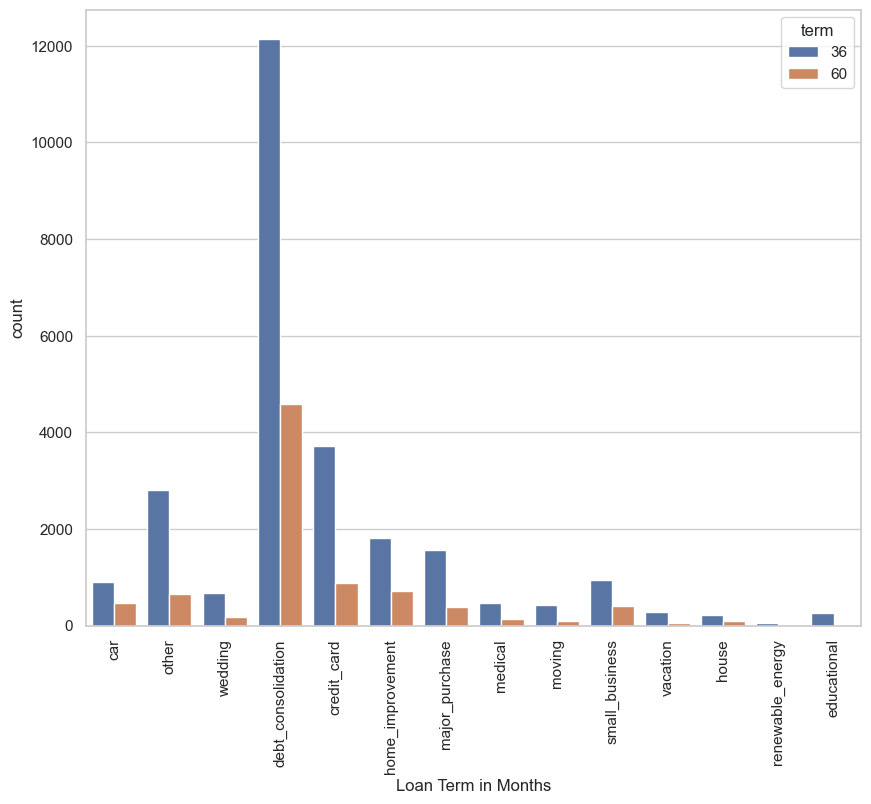

In [68]:
## Loan term and purpose
plt.figure(figsize=[10,8])
sns.countplot( data=loan , x="purpose", hue='term', palette='deep')
plt.xlabel('Loan Term in Months')
plt.xticks(rotation=90)
plt.show()

#### Check if Interest Rate is dependent on grade

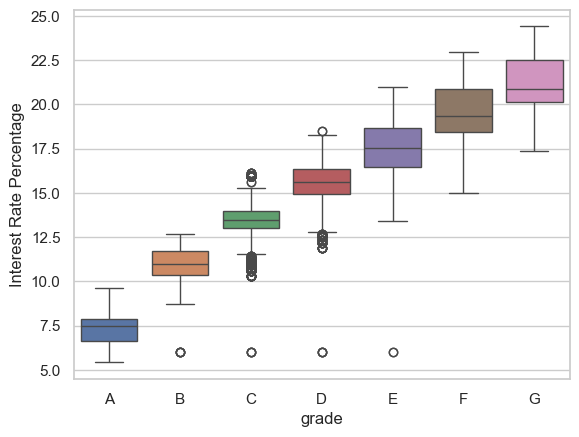

In [69]:
grade_order = sorted(loan['grade'].unique())
sns.boxplot(y='int_rate', x='grade', data=loan , palette='deep' , order=grade_order)
plt.ylabel('Interest Rate Percentage')
plt.show()

#### Observations - 
<b> Variables - grade and interest rate </b> : There appears to be an inverse relationship between the grade of the Borrowers and the interest rate. Borrowers with higher credit grades tend to receive lower interest rates for their loans.

## Multivariate Analysis

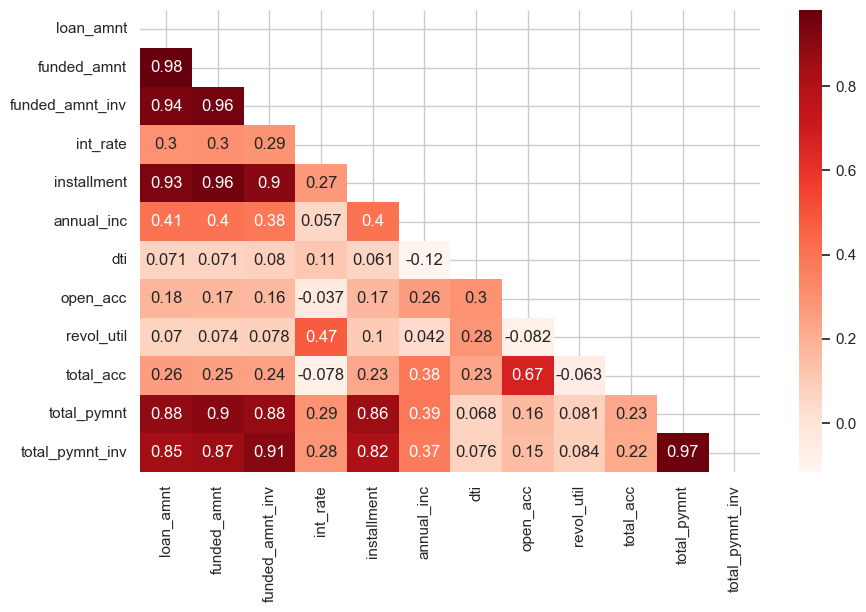

In [70]:
plt.figure(figsize=(10,6))
mask = np.triu(loan[num_cols].corr())
sns.heatmap(loan[num_cols].corr(),mask=mask,annot=True,cmap="Reds")
plt.show()

#### Observations-
#### For Charged Off loans -
1. loan_amnt, funded_amnt_inv, and installment have strong positive correlations, indicating that higher loan amounts and funded amounts are associated with higher installments.
2. int_rate has a moderate positive correlation with revol_util, suggesting that higher interest rates are associated with higher revolving line utilization rates.

In [71]:
loans_defaults=loan[ loan['loan_status'] =='Charged Off']
loans_defaults.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_util,total_acc,total_pymnt,total_pymnt_inv,pub_rec_bankruptcies,emp_length_dict,issue_d_month,issue_d_year,earliest_cr_line_month,earliest_cr_line_year
1,2500,2500,2500.0,60,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,2011-12-01,Charged Off,car,GA,1.00,0,1999-04-01,5,3,0,9.4,4,1008.71,1008.71,0.0,0,12,2011,4,1999
9,5375,5375,5350.0,60,12.69,121.45,B,B5,< 1 year,RENT,15000.0,Verified,2011-12-01,Charged Off,other,TX,18.08,0,2004-09-01,0,2,0,36.5,3,1476.19,1469.34,0.0,0,12,2011,9,2004
12,9000,9000,9000.0,36,13.49,305.38,C,C1,< 1 year,RENT,30000.0,Source Verified,2011-12-01,Charged Off,debt_consolidation,VA,10.08,0,2004-04-01,1,4,0,91.7,9,2270.70,2270.70,0.0,0,12,2011,4,2004
14,10000,10000,10000.0,36,10.65,325.74,B,B2,3 years,RENT,100000.0,Source Verified,2011-12-01,Charged Off,other,CA,7.06,0,1991-05-01,2,14,0,55.5,29,7471.99,7471.99,0.0,3,12,2011,5,1991
21,21000,21000,21000.0,36,12.42,701.73,B,B4,10+ years,RENT,105000.0,Verified,2011-12-01,Charged Off,debt_consolidation,FL,13.22,0,1983-02-01,0,7,0,90.3,38,14025.40,14025.40,0.0,10,12,2011,2,1983


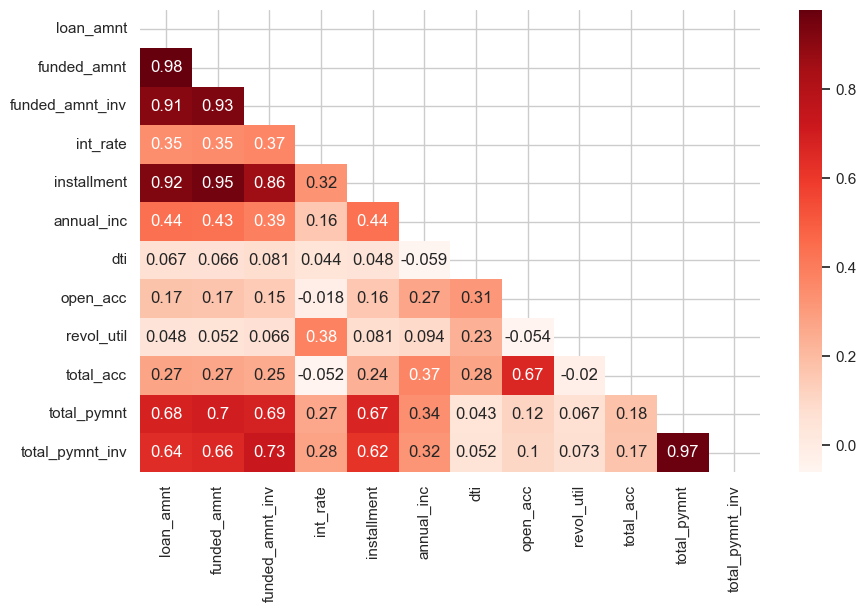

In [72]:
plt.figure(figsize=(10,6))
mask = np.triu(loans_defaults[num_cols].corr())
sns.heatmap(loans_defaults[num_cols].corr(),mask=mask,annot=True,cmap="Reds")
plt.show()

#### Observations-
#### For Charged Off loans -
1. loan_amnt, funded_amnt_inv, and installment have strong positive correlations, indicating that higher loan amounts and funded amounts are associated with higher installments.
2. int_rate has a moderate positive correlation with revol_util, suggesting that higher interest rates are associated with higher revolving line utilization rates.

### Specific Numerical Columns Vs Loan Amount , Interest Rate with indicator as  Specific Categorical Columns
- Specific Numerical Columns = ['annual_inc','installment', 'total_pymnt_inv', 'int_rate' ,'dti'] 
- Specific Categorical Columns = ['loan_status','verification_status', 'term', 'grade' ,'home_ownership']
- We would like analyse these columns more to get some more insights

In [73]:
# Numerical Vs Numerical Vs Categorical
spl_num_cols= ['loan_amnt','annual_inc','installment', 'total_pymnt_inv' ,'dti' , 'int_rate'] 
spl_cat_cols= ['loan_status','verification_status', 'term', 'grade' ,'home_ownership','purpose','emp_length']

### Specific Numerical Columns Vs Loan Amount with Indicator Specific Categorical Columns

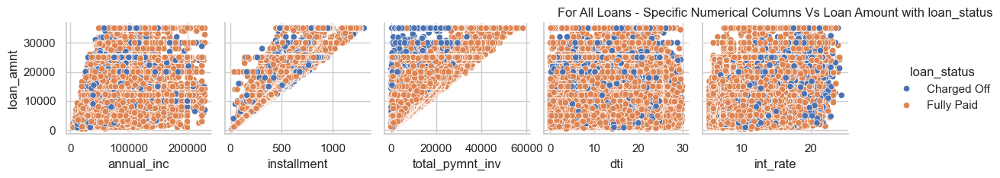

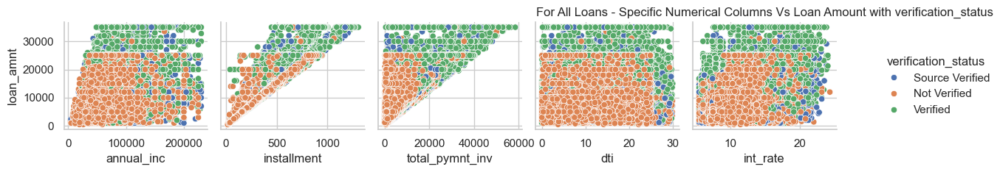

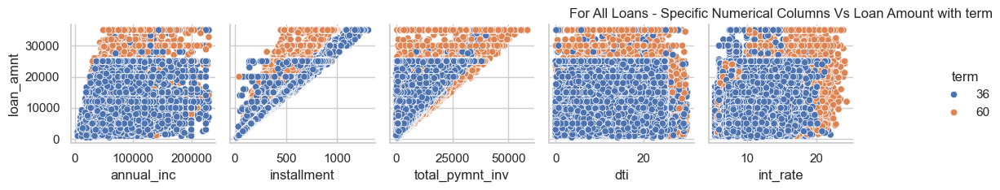

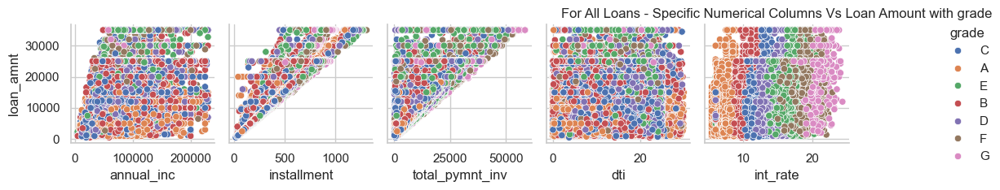

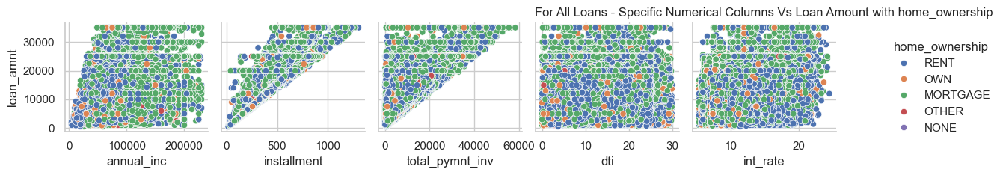

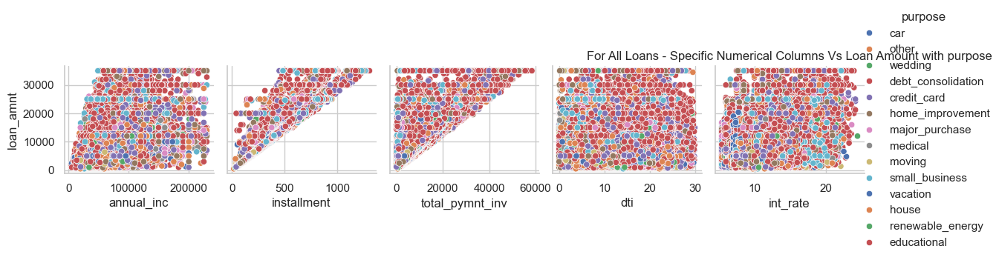

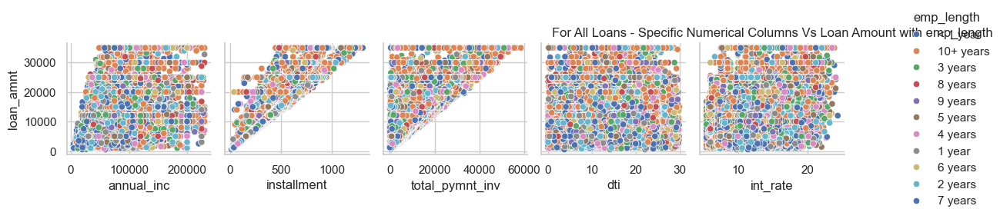

In [74]:
x_cols = spl_num_cols.copy()
x_cols.remove('loan_amnt')
# Create a scatter plot
for hue_col in spl_cat_cols:
    sns.pairplot(loan,x_vars=x_cols,y_vars=['loan_amnt'],hue=hue_col,kind='scatter',palette='deep',aspect=0.8)
    plt.title(f'For All Loans - Specific Numerical Columns Vs Loan Amount with {hue_col}')
    plt.ylabel('Loan Amount')
    plt.tight_layout()
    plt.show()

### Specific Numerical Columns Vs Interest Rate with Indicator Specific Categorical Columns

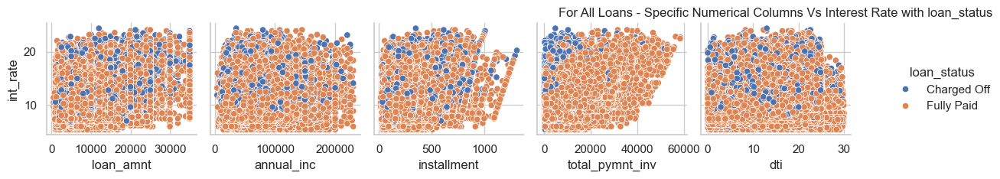

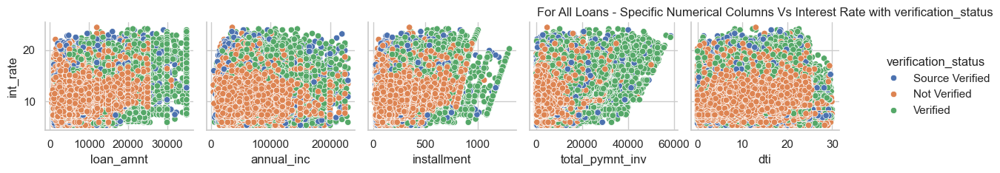

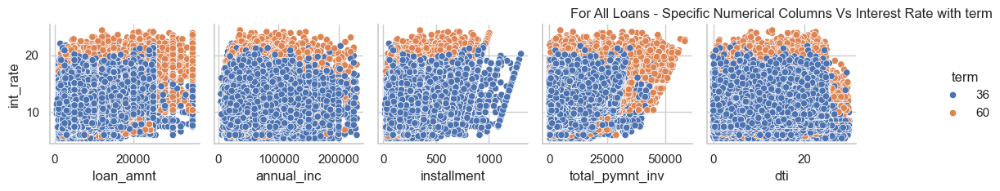

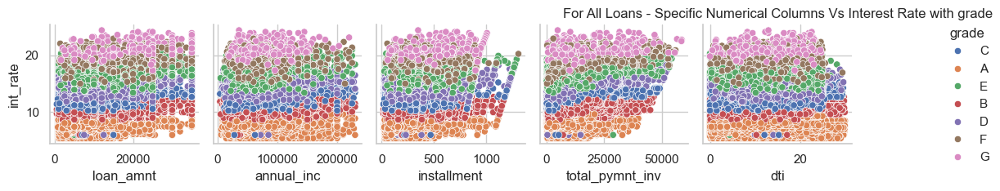

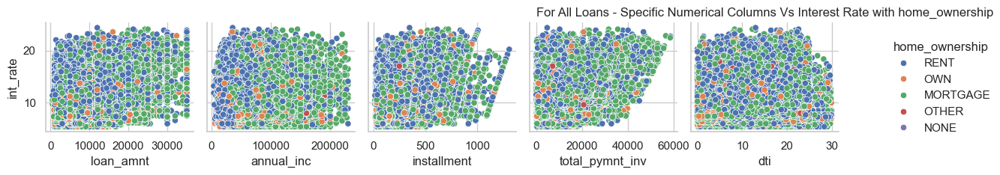

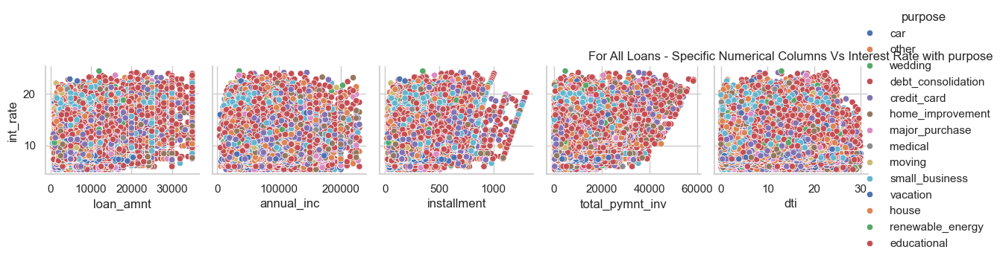

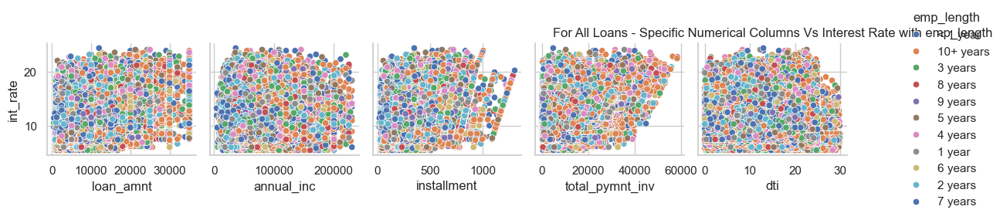

In [75]:
x_cols = spl_num_cols.copy()
x_cols.remove('int_rate')
# Create a scatter plot
for hue_col in spl_cat_cols:
    sns.pairplot(loan,x_vars=x_cols,y_vars=['int_rate'],hue=hue_col,kind='scatter',palette='deep',aspect=0.8)
    plt.title(f'For All Loans - Specific Numerical Columns Vs Interest Rate with {hue_col}')
    plt.ylabel('Interest Rate')
    plt.tight_layout()
    plt.show()

### Specific Numerical Columns Vs Annual Income with Indicator Specific Categorical Columns

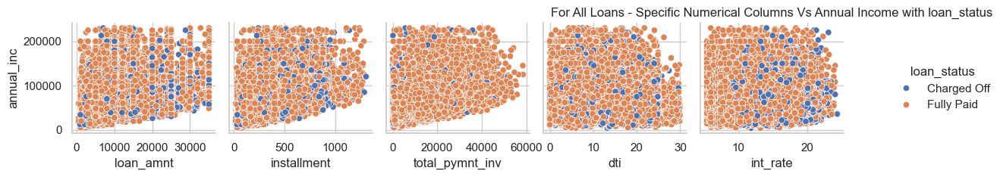

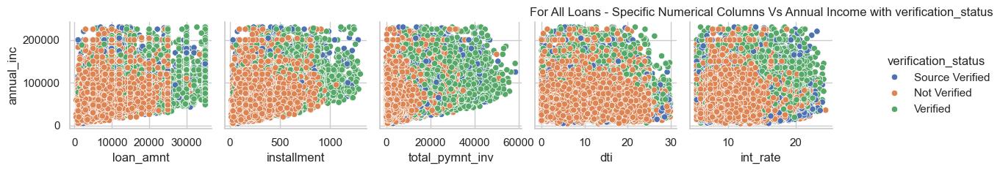

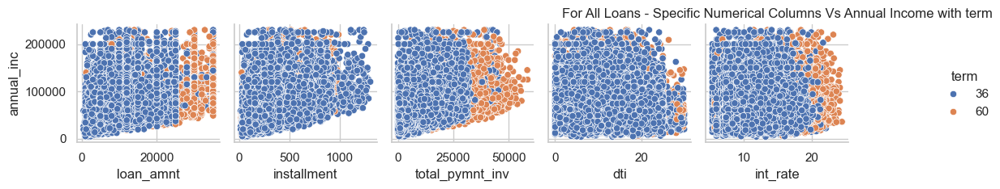

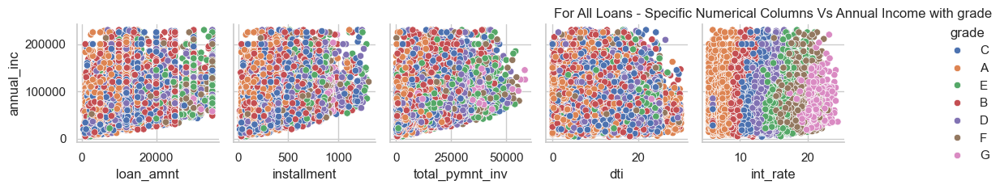

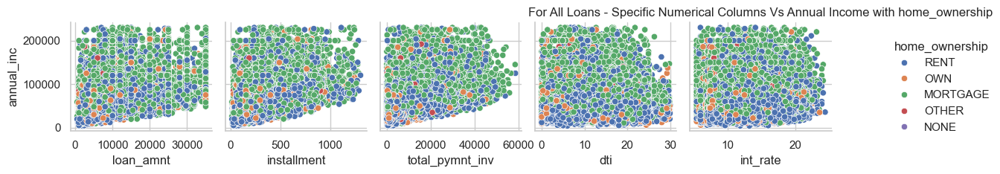

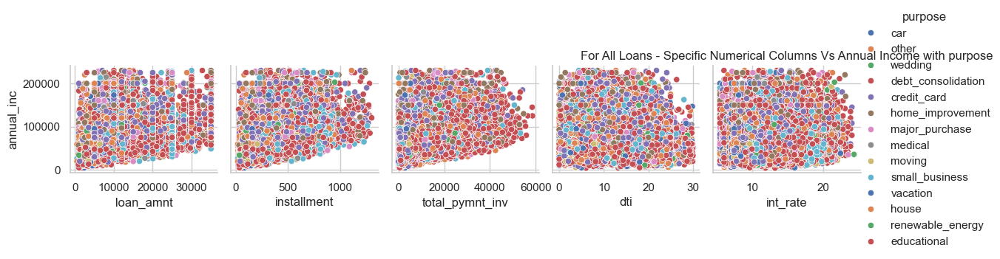

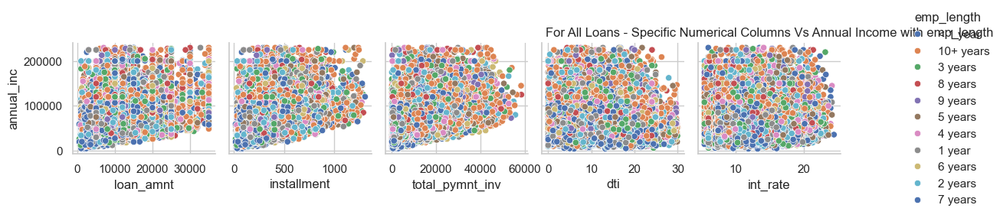

In [76]:
x_cols = spl_num_cols.copy()
x_cols.remove('annual_inc')
# Create a scatter plot
for hue_col in spl_cat_cols:
    sns.pairplot(loan,x_vars=x_cols,y_vars=['annual_inc'],hue=hue_col,kind='scatter',palette='deep',aspect=0.8)
    plt.title(f'For All Loans - Specific Numerical Columns Vs Annual Income with {hue_col}')
    plt.ylabel('Annual Income')
    plt.tight_layout()
    plt.show()

### Swarm Plot Analysis  for only Charged Off Loans - Loan Amount Vs Home Ownership with Verification Status

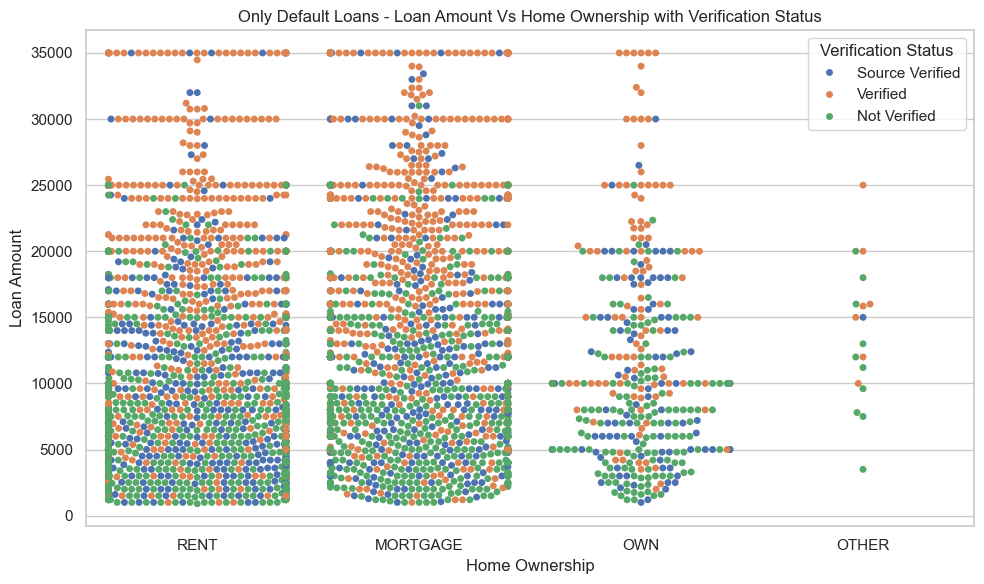

In [77]:
# Create a swarm plot
plt.figure(figsize=(10, 6))
sns.swarmplot(data=loans_defaults, x='home_ownership', y='loan_amnt', hue='verification_status', palette='deep')
plt.title('Only Default Loans - Loan Amount Vs Home Ownership with Verification Status')
plt.xlabel('Home Ownership')
plt.ylabel('Loan Amount')
plt.legend(title='Verification Status')
plt.tight_layout()
plt.show()

### Swarm Plot Analysis  for only Charged Off Loans - Loan Amount Vs Purpose with Verification Status

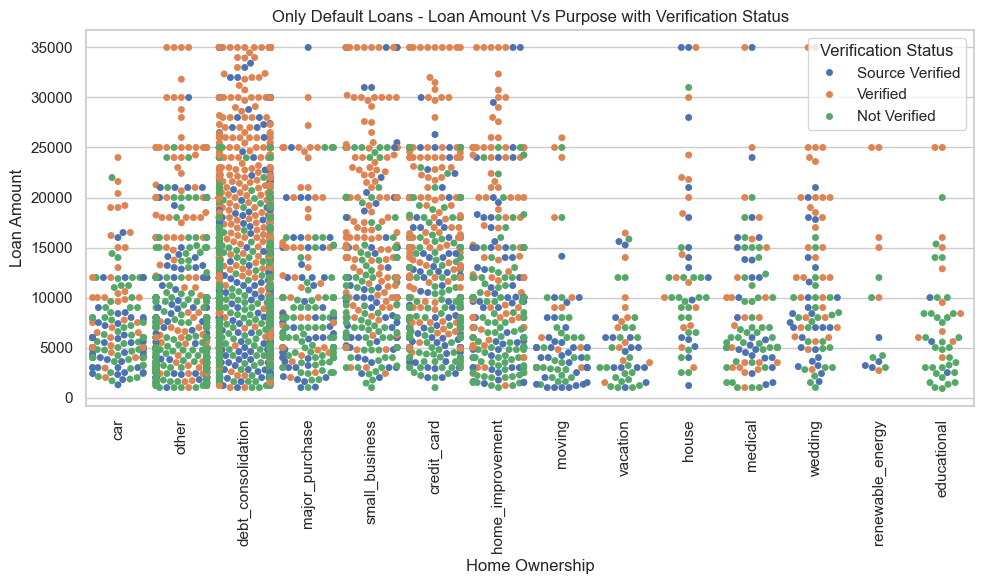

In [78]:
# Create a swarm plot
plt.figure(figsize=(10, 6))
sns.swarmplot(data=loans_defaults, x='purpose', y='loan_amnt', hue='verification_status', palette='deep')
plt.title('Only Default Loans - Loan Amount Vs Purpose with Verification Status')
plt.xlabel('Home Ownership')
plt.ylabel('Loan Amount')
plt.legend(title='Verification Status')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Observations -
1. When the loan amount increases, number of installment, total_pymnt_inv, int_rate also increases.
2. When the loan amount and int_rate increases , possibility of loans to be charged off increases.
3. Borrowers with low Dti are not verified. 
4. Borrowers with verification status "Not-Verified" are most likely to get loan less than 25k.
5. Borrowers with verification status "Verified" are most likely to get loan greater than 25k.
6. Term of 60 months is chosen or given only for high amount of loans greater than 25k.
7. Borrowers with lower term has higher installments comparatively.
8. Borrowers with 60 months term has highest share to total_pymnt_inv.
9. Across all categories of home ownership, borrowers with loan amount less than 25k are most likely to be source verified.
10. Across all categories of home ownership, borrowers with loan amount greater than 25k gets verified.

### All Categorical Columns Vs Median Loan Amount with indicator as  Loan Status

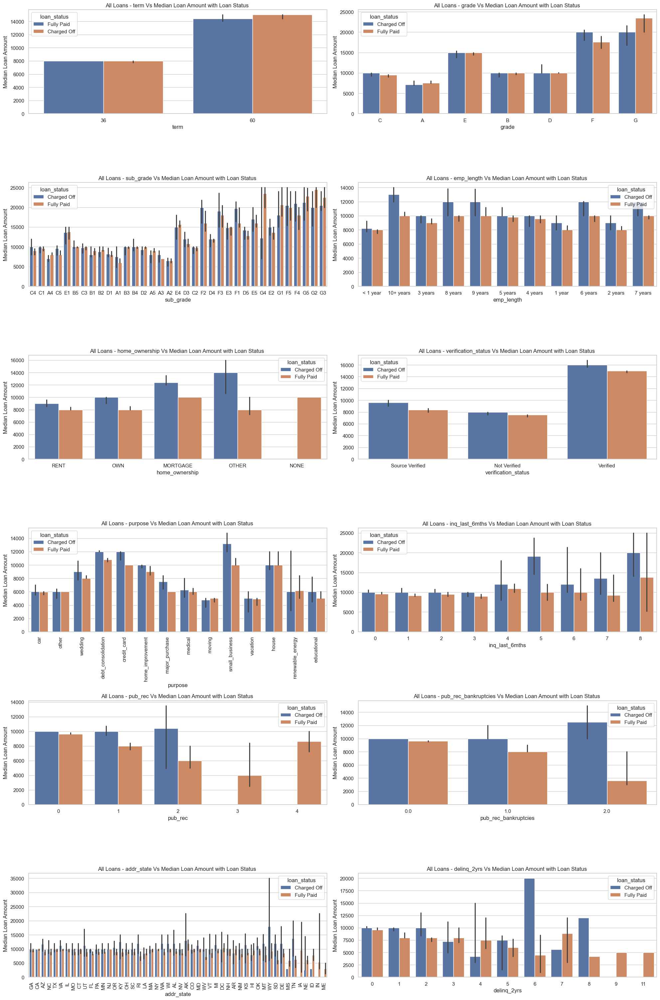

In [79]:
# Create a bar plot
# Numerical Vs Categorical Vs Categorical
plt.figure(figsize=(20,40))
for ax , col in enumerate(cat_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.barplot(data=loan, x=col, y='loan_amnt', hue='loan_status', palette='deep',estimator='median')
    plt.title(f'All Loans - {col} Vs Median Loan Amount with Loan Status ')
    if col in ('purpose','addr_state') :
        plt.xticks(rotation=90)
    plt.xlabel(f'{col}')
    plt.ylabel('Median Loan Amount')
plt.tight_layout()
plt.show()

### Specific Numerical Columns Vs Median Interest Rate with indicator as  Loan Status

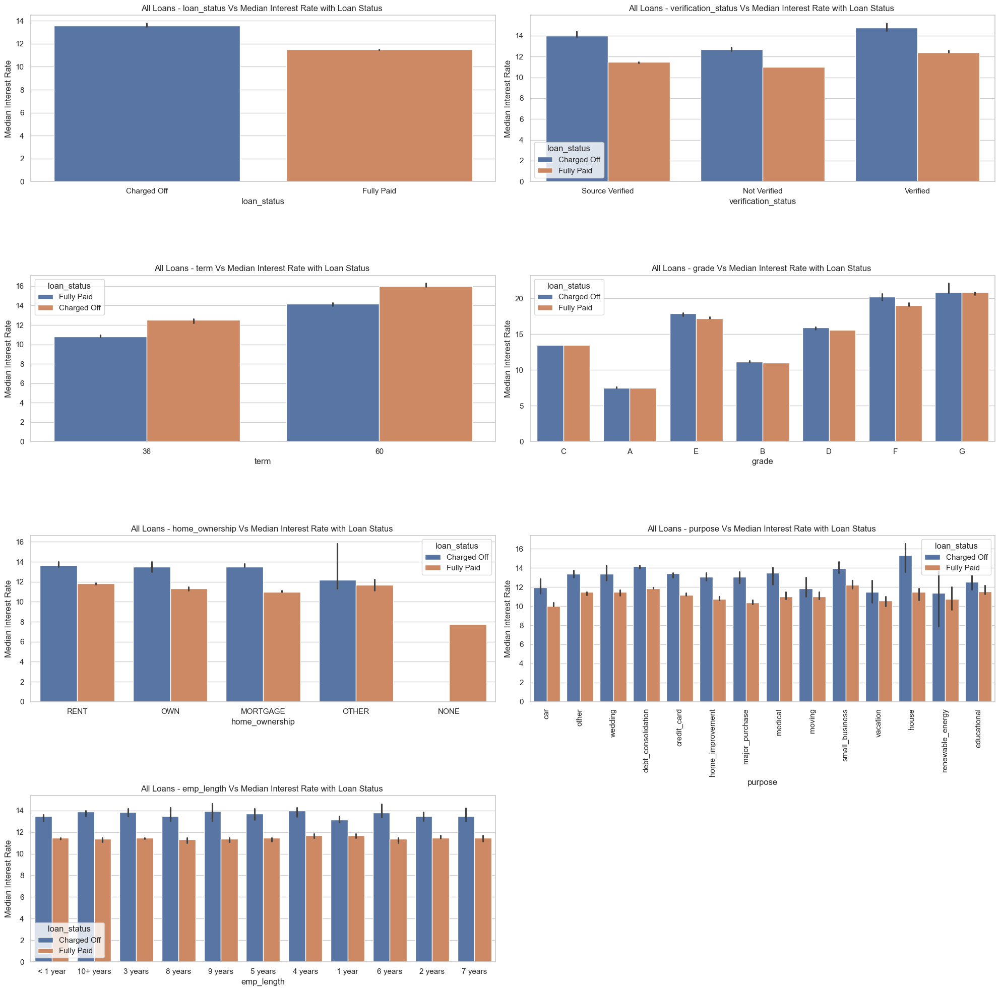

In [80]:
# Create a bar plot
# Numerical Vs Categorical Vs Categorical
plt.figure(figsize=(20,40))
for ax , col in enumerate(spl_cat_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.barplot(data=loan, x=col, y='int_rate', hue='loan_status', palette='deep',estimator='median')
    plt.title(f'All Loans - {col} Vs Median Interest Rate with Loan Status ')
    if col in ('purpose','addr_state') :
        plt.xticks(rotation=90)
    plt.xlabel(f'{col}')
    plt.ylabel('Median Interest Rate')
plt.tight_layout()
plt.show()

### Specific Numerical Columns Vs Median Annual Income with indicator as  Loan Status

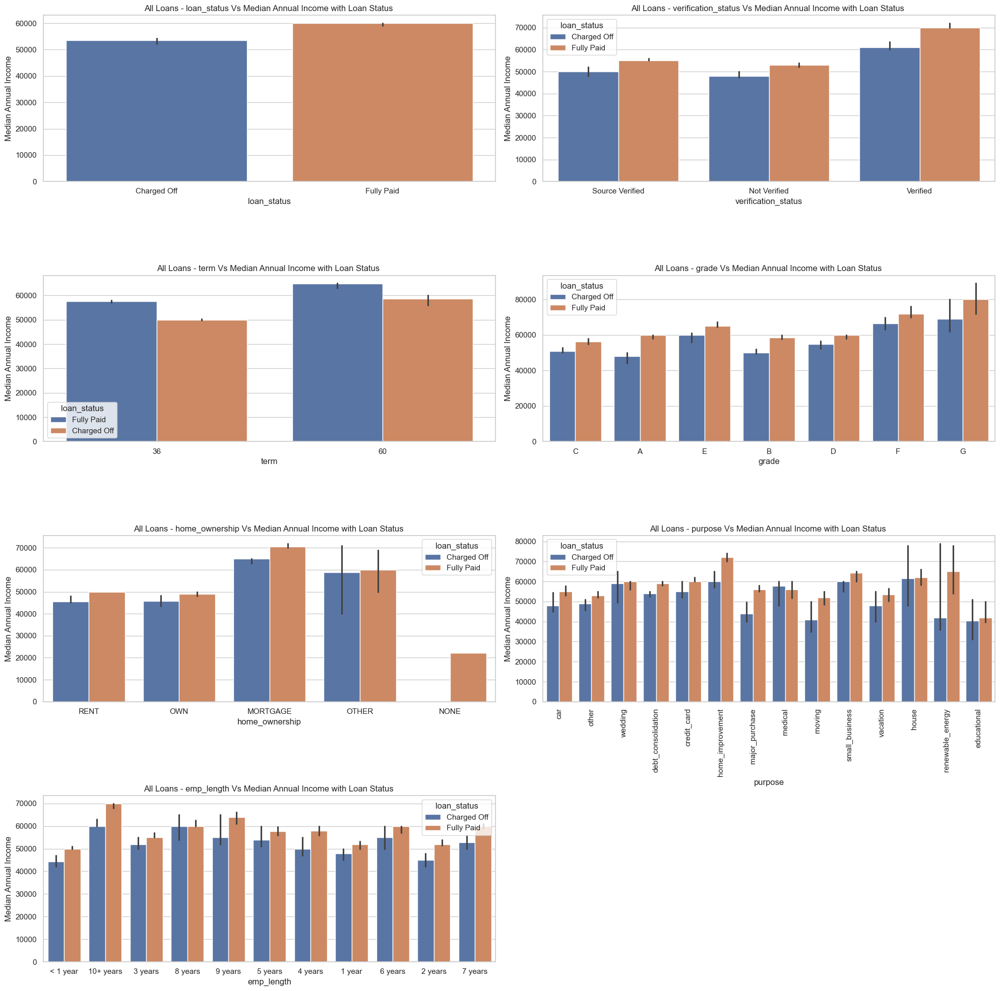

In [81]:
# Create a bar plot
# Numerical Vs Categorical Vs Categorical
plt.figure(figsize=(20,40))
for ax , col in enumerate(spl_cat_cols):
    plt.subplot(8, 2, ax+ 1)
    sns.barplot(data=loan, x=col, y='annual_inc', hue='loan_status', palette='deep',estimator='median')
    plt.title(f'All Loans - {col} Vs Median Annual Income with Loan Status ')
    if col in ('purpose','addr_state') :
        plt.xticks(rotation=90)
    plt.xlabel(f'{col}')
    plt.ylabel('Median Annual Income')
plt.tight_layout()
plt.show()

### Driving Factors to Charge Off

#### The above analysis with respect to the charged off loans. There is a more probability of defaulting when : 
1. Borrowers with high interest and 10+ years of employment length. Also when employment length is 10yrs and loan amount is 12k-14k 
2. Borrowers living on mortgage with loan amount greater than 12000.
3. Loan for debt consolidation, credit card, small business with loan amount greater than 12000.
4. Loan provided for house purpose with average interest grater than 12%.
5. Loan provided with an average of 11% interest rate for 36months of tenure.
6. Loan provided with an average of 14% interest rate for 60months of tenure.
7. Average loan amount greater than 15000 with grade  F, G .
8. Installments between 800 - 12000 with average interest greater than 15%.
9. Average interest rate of 17% with installment greater than 1200.
10. Applicants taking loan for 'home improvement' and have income of more than 60k 
11. Applicants taking loan for 'renewable energy' and have income of more than 45K. 
12. Applicants whose home ownership is 'MORTGAGE and have income of 60-70k
13. Applicants who receive interest at the rate of 21-24% and have an income of 70k-80k
14. For grade G and interest rate above 17%
15. When the loan is verified and loan amount is above 16k
16. Applicants who have taken a loan for small business and the loan amount is greater than 12K
17. Applicants whose home ownership is 'MORTGAGE and have loan of 14-16k